**Для корректной работы моделей YOLOv8 необходимо переключать ядро Jupyter Notebook — это окружение, в котором запускаются ячейки.**
1. В верхнем меню Jupyter: `Kernel → Change Kernel`
2. ядро: `Python 3.12 (Mask R-CNN)` для **YOLOv8**

# Модель YOLO



Мы используем команду `!pip install` для установки необходимых библиотек, которые понадобятся для работы с моделями YOLO. 

- **pip** (Python Package Installer) — это менеджер пакетов для Python, который позволяет устанавливать различные сторонние библиотеки и зависимости. 

In [1]:
!pip install -q ultralytics opencv-python pycocotools matplotlib

- **ultralytics** — Библиотека YOLOv8 (именно она содержит `YOLO(...)`)
- **opencv-python** — Работа с изображениями (чтение, отображение и т.п.)
- **matplotlib** — Построение графиков, визуализация изображений

Обновили pip

In [2]:
!python -m pip install --upgrade pip

Подключаем библиотеки и задаём пути к изображениям и разметке

In [1]:
!pip install --upgrade optree


In [23]:
import os  # для работы с файлами и папками - Стандартная библиотека Python для работы с файлами и папками: можно создавать, удалять, проверять наличие путей, читать списки файлов и т.д.
import torch  # для работы с нейросетями - Основная библиотека PyTorch — используется для работы с тензорами, обучением нейросетей, запуском на GPU и обработкой данных
from pathlib import Path  # для удобной записи путей к файлам
import cv2  # для чтения и обработки изображений
import matplotlib.pyplot as plt  # для показа картинок и графиков
import numpy as np # Чтобы работать с числовыми массивами
import pandas as pd # Работы с таблицами, данными, Excel-файлами, CSV, базами данных и т.д.

In [13]:
from PIL import Image  # Импорт модуля Image из библиотеки Pillow (PIL)

# Image умеет:
# 📂 открывать изображения (.jpg, .png, .bmp и др.)
# ✂️ обрезать, изменять размер, поворачивать, накладывать фильтры
# 💾 сохранять изображения в другие форматы
# 📊 получать метаданные (ширина, высота, формат и т.д.)

Путь к YOLOv8-разметке

In [14]:
base_yolo = Path("D:/Segmentation_Project/Datasets/Obchaya Razmetka YOLOv8")
print(base_yolo)

D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8


Пути к подкатегориям

In [15]:
# Пути к изображениям и меткам
train_images = base_yolo / "train" / "images"
val_images = base_yolo / "validation" / "images"
train_labels = base_yolo / "train" / "labels"
val_labels = base_yolo / "validation" / "labels"

# Выводим пути для проверки
print(train_images)
print(val_images)
print(train_labels)
print(val_labels)

D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\images
D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\images
D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\labels
D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\labels


Файл `data.yaml` нужен для обучения YOLO. В нём описывается структура и классы датасета:

- **`path`** — путь к корневой папке с данными  
- **`train`** — путь к обучающим изображениям (относительно `path`)  
- **`val`** — путь к валидационным изображениям  
- **`nc`** — количество классов  
- **`names`** — список имён классов (в порядке индексов)

Формируем YAML-файл с описанием разметки для YOLO.
Здесь указываем путь к датасету, папки train/val и список классов

In [10]:
data_yaml = f"""
path: {base_yolo}
train: train/images
val: validation/images
nc: 11
names:
  0: '0_Zavod'
  1: '0_position'
  2: '0_zakaz'
  3: '1_Marka'
  4: '2_God'
  5: '3_Plavka'
  6: '4_Partiya'
  7: '5_Nomer'
  8: '6_Razmer'
  9: 'Yglerod'
  10: 'stoikost'

"""


Сохраняем в файл

In [11]:
with open(base_yolo / "data.yaml", "w") as f:
    f.write(data_yaml)

print("✅ data.yaml успешно создан с 11 классами!")

✅ data.yaml успешно создан с 11 классами!


Читаем файл data.yaml

In [16]:
with open(base_yolo / "data.yaml", "r") as f:
    print(f.read())

names:
  0: 0_Zavod
  1: 0_position
  2: 0_zakaz
  3: 1_Marka
  4: 2_God
  5: 3_Plavka
  6: 4_Partiya
  7: 5_Nomer
  8: 6_Razmer
  9: Yglerod
  10: stoikost
nc: 11
path: D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8
test: test/images
train: train/images
val: validation/images



 Импорт YOLO-модели из библиотеки ultralytics

In [17]:
from ultralytics import YOLO

Загружаем предобученные модели сегментации

## Yolo11

### Yolo11n-seg

In [23]:
model_YOLO11_n_seg = YOLO("yolo11n-seg.pt")


100%|█████████████████████████████████████████████████████████████████████████████| 5.90M/5.90M [00:00<00:00, 14.0MB/s]


In [26]:
results = model_YOLO11_n_seg.train(
    data=base_yolo / "data.yaml",
    epochs=50,
    imgsz=640,
    batch=2,
    device=0
)

New https://pypi.org/project/ultralytics/8.3.110 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
engine\trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\data.yaml, epochs=50, time=None, patience=100, batch=1, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

100%|█████████████████████████████████████████████████████████████████████████████| 5.35M/5.35M [00:00<00:00, 19.1MB/s]


AMP: checks passed 


train: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\labels.cache... 3222 images, 10 backgrou
val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\labels.cache... 228 images, 0 backgro


Plotting labels to runs\segment\train2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs\segment\train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      0.67G      1.582      2.281      3.121       1.24         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.726      0.457      0.592      0.438      0.728      0.459        0.6      0.392

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.682G      1.237      1.682      1.893      1.064         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.771      0.768      0.855       0.61      0.775      0.771      0.863      0.553

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.682G      1.145      1.542      1.465       1.03         17        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.817      0.843      0.896       0.66      0.824      0.846      0.899      0.602



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.682G      1.073      1.456      1.212      1.005          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.903      0.871      0.933      0.685      0.912      0.883      0.947       0.65



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.682G       1.02      1.387      1.053     0.9838          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.935      0.916      0.963       0.71      0.942      0.919      0.967      0.655



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.682G      1.008      1.366      1.011     0.9859         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.916      0.898      0.947      0.713      0.921        0.9      0.955      0.665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.682G     0.9774      1.326      0.934     0.9683          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.94      0.922      0.963      0.719      0.941      0.925      0.968      0.666



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.682G     0.9651      1.307      0.897     0.9638         29        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.945      0.928       0.96      0.733      0.955       0.94       0.97      0.679



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.682G     0.9336      1.275     0.8083      0.956          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.946      0.931      0.963      0.735      0.948      0.934      0.971      0.676



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.682G     0.9315      1.261     0.7781     0.9537          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.957      0.934      0.966       0.74      0.963      0.936      0.971      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.682G     0.9004      1.228     0.7629     0.9443          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.958      0.941      0.969      0.745      0.965      0.949      0.978      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.682G     0.8931      1.213     0.7198     0.9418          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.965      0.935      0.971      0.747      0.971       0.94      0.979      0.699



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.682G     0.8928      1.196     0.7042     0.9375          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.957      0.952      0.974      0.755      0.962      0.961      0.985      0.701



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.682G     0.8669      1.176     0.6676     0.9292         28        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.969      0.956      0.979      0.759      0.971      0.961      0.983      0.697



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.682G     0.8657      1.183     0.7167     0.9337          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.949      0.935       0.97       0.76       0.95      0.936      0.976      0.697



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.682G     0.8538      1.171     0.6722     0.9311         28        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.936      0.943      0.968      0.753      0.951      0.943      0.975      0.692



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.682G     0.8449      1.155     0.6671     0.9228          4        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.95      0.942      0.972      0.749      0.962      0.939      0.978      0.689



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.682G     0.8459      1.143     0.6526     0.9309         13        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.962      0.947      0.975       0.76       0.97      0.955      0.985      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.682G     0.8345       1.13     0.6451     0.9239          6        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966       0.96      0.976      0.769      0.968      0.962      0.983      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.682G     0.8216      1.116     0.6236     0.9227         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.963       0.96      0.976      0.771      0.965      0.963      0.982        0.7



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.682G     0.8266       1.13     0.6102     0.9209         32        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.965      0.946       0.98      0.774      0.973      0.946      0.981       0.71



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.682G     0.8196      1.108     0.6229     0.9198         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.961      0.953      0.974      0.775      0.964      0.957       0.98      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.682G     0.8167      1.108     0.6044     0.9185         14        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.961      0.965      0.976       0.77      0.964       0.97      0.982      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.682G     0.8073      1.108     0.5795     0.9175          2        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.958       0.96       0.98       0.78      0.958      0.963      0.984      0.712



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.682G     0.7966       1.09      0.564     0.9131          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966      0.959       0.98       0.78      0.968      0.964      0.983      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.682G     0.7961      1.085     0.5816     0.9144         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.965      0.954      0.976      0.784      0.975      0.957      0.984      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.682G     0.7928      1.093     0.5619     0.9095          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.963      0.976      0.985      0.786      0.965      0.976      0.988       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.682G     0.7744      1.062       0.56      0.904         16        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.962      0.983      0.788      0.979      0.963      0.986      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.682G     0.7821      1.069     0.5497     0.9073         20        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.963      0.969      0.982      0.786      0.965      0.967      0.984      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.682G     0.7698      1.045     0.5424     0.9027         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.965      0.985       0.79      0.972      0.963      0.983      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.682G     0.7691      1.052     0.5651     0.9053         24        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.973      0.957      0.984      0.787      0.969      0.954      0.982      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.682G     0.7692      1.054     0.5313     0.9063         14        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.967      0.972      0.989      0.795      0.964      0.968      0.985      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.682G     0.7665      1.044     0.5409     0.9027          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.957      0.985      0.794       0.98      0.959      0.987      0.729



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.682G     0.7544      1.033     0.5131     0.8988          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.963      0.973      0.986      0.795      0.961      0.973      0.987       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.682G     0.7654      1.041     0.5478     0.9017         12        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.973       0.96       0.98      0.795      0.972      0.963      0.984      0.729



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.682G     0.7469      1.026     0.5128     0.9012         34        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.969      0.965      0.986      0.792      0.978      0.961      0.987      0.726



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.682G     0.7436      1.019     0.5155     0.8956         10        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.969      0.983      0.788      0.983      0.973      0.989      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.682G     0.7347      1.008     0.5107     0.8926         10        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.971      0.987      0.792      0.976      0.969      0.984      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.682G     0.7383      1.018     0.5431     0.8966          5        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.971      0.985      0.795      0.972      0.966      0.983      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.682G     0.7331      1.013     0.4995     0.8952         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.973      0.966      0.982      0.794      0.973      0.965       0.98      0.723


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.682G     0.7014     0.9525     0.4857       0.88          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.977      0.959      0.983      0.796       0.98      0.962      0.988      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.682G     0.6961     0.9474     0.4718     0.8773          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.968      0.972      0.988      0.797      0.965      0.967      0.985      0.731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.682G     0.6846     0.9298     0.4523     0.8779          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.97      0.974      0.985      0.797      0.979      0.975      0.988      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.682G     0.6791     0.9268     0.4498     0.8761          7        640: 100%|██████████| 3222/3222 [3
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.971      0.986      0.799      0.973      0.974      0.988      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.682G     0.6669     0.9131       0.44     0.8724          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.968      0.971      0.982      0.802      0.975      0.962      0.982      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.682G     0.6648     0.9125     0.4393     0.8708          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.971      0.983      0.802      0.973       0.97      0.983      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.682G     0.6616     0.9063     0.4332     0.8698          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.974      0.986      0.804      0.974      0.974      0.986      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.682G     0.6587     0.8995      0.427     0.8683          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.972      0.985      0.803      0.974      0.971      0.984      0.737



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.682G     0.6551     0.9008     0.4334      0.867          6        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.969      0.971      0.985      0.803      0.975      0.968      0.985      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.682G     0.6516     0.8965     0.4303     0.8685          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.97      0.975      0.986      0.804      0.972      0.966      0.983      0.735



50 epochs completed in 8.019 hours.
Optimizer stripped from runs\segment\train2\weights\last.pt, 6.0MB
Optimizer stripped from runs\segment\train2\weights\best.pt, 6.0MB

Validating runs\segment\train2\weights\best.pt...
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLO11n-seg summary (fused): 113 layers, 2,836,713 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.975      0.972      0.986      0.803      0.974      0.971      0.984      0.737
               0_Zavod        137        137      0.998          1      0.995      0.881      0.998          1      0.995      0.799
            0_position         89         89          1      0.932      0.985      0.567      0.939      0.871      0.918      0.406
               0_zakaz         86         86      0.964      0.941       0.98      0.841      0.964      0.938      0.984      0.757
               1_Marka        194        194      0.988       0.99      0.993      0.885      0.989       0.99      0.993      0.795
                 2_God        137        137      0.988          1      0.995      0.821      0.989          1      0.995      0.786
              3_Plavka        228        229      0.981      0.991      0.995      0.896      0.981      0.991      0.995      0.815
             4_Partiya        228        228      0.976      0.969   

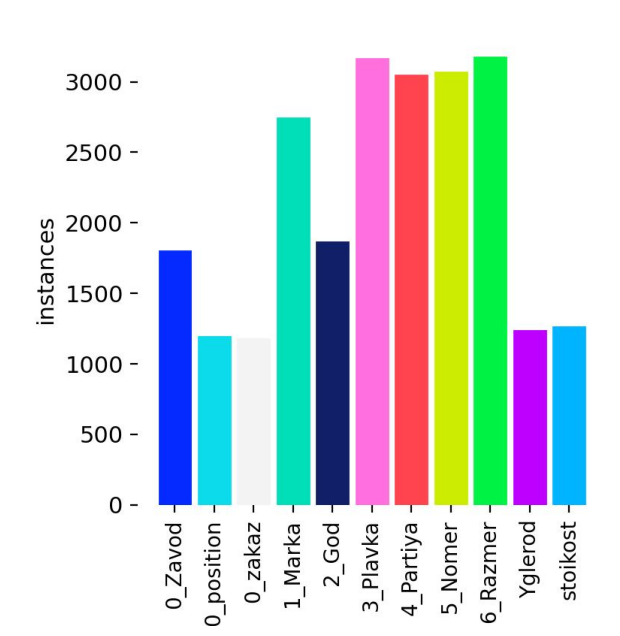

In [45]:
from PIL import Image
import matplotlib.pyplot as plt

# Указываем путь к изображению
img_path = r'D:\Segmentation_Project\Notebooks\runs\segment\train_yolo11n-seg\labels.jpg' 
img = Image.open(img_path)

# Обрезаем изображение, оставляя только гистограмму (левую и верхнюю часть)
left = 0
top = 0
right = img.width // 2  # Оставляем только левую часть
bottom = img.height // 1.95 # Оставляем только верхнюю половину

# Создаем обрезанное изображение
cropped_img = img.crop((left, top, right, bottom))

# Увеличиваем изображение для лучшей видимости
fig, ax = plt.subplots(figsize=(14, 8))  # Увеличиваем размер графика
ax.imshow(cropped_img)
ax.axis('off')  # Отключаем оси
plt.show()

In [9]:
from ultralytics import YOLO

# Загрузка обученной модели сегментации (YOLOv8) с весами
model_path = "runs/segment/train_yolo11n-seg/weights/best.pt"
model = YOLO(model_path)
print("Модель загружена. Классы:", model.names)

Модель загружена. Классы: {0: '0_Zavod', 1: '0_position', 2: '0_zakaz', 3: '1_Marka', 4: '2_God', 5: '3_Plavka', 6: '4_Partiya', 7: '5_Nomer', 8: '6_Razmer', 9: 'Yglerod', 10: 'stoikost'}


In [10]:
from pathlib import Path
import yaml

# Базовая директория проекта
base_yolo = Path(r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8")

# Пути к test/images и labels (если пригодится позже)
test_images = base_yolo / "test" / "images"
test_labels = base_yolo / "test" / "labels"

# Путь к data.yaml
yaml_path = base_yolo / "data.yaml"

# Загружаем YAML-файл
with open(yaml_path, 'r', encoding='utf-8') as f:
    data = yaml.safe_load(f)

# Добавляем путь к test, если его ещё нет
if 'test' not in data:
    # Относительный путь от data.yaml к test/images
    test_path = test_images.relative_to(base_yolo).as_posix()
    data['test'] = test_path

# Сохраняем изменения
with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data, f, allow_unicode=True)

print(f"✅ Добавлено test: {data['test']} в data.yaml")

✅ Добавлено test: test/images в data.yaml


In [12]:

# Запуск тестирования
metrics = model.val(
    data=base_yolo / "data.yaml",   # путь к конфигу
    split='test',       # тестовый набор
    plots=True,         # сохранить графики
    device=0            # можно указать GPU (или 'cpu')
)

Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)


val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\labels.cache... 226 images, 0 backgrounds, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING  Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING  Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        226       1716      0.974      0.955      0.976      0.812       0.97      0.952      0.971      0.735
               0_Zavod        136        136          1      0.981       0.99      0.889          1      0.982       0.99      0.811
            0_position         82         82      0.892      0.808      0.882      0.501      0.825      0.748      0.801      0.338
               0_zakaz         89         89      0.992       0.91      0.969      0.806      0.992       0.91      0.974      0.746
               1_Marka        194        194      0.978      0.985      0.987      0.884      0.978      0.985      0.987      0.799
                 2_God        136        136      0.984      0.993      0.995      0.871      0.984      0.993      0.995      0.806
              3_Plavka        226        226      0.991          1      0.995      0.923      0.991          1      0.995      0.844
             4_Partiya        223        223       0.98      0.969   

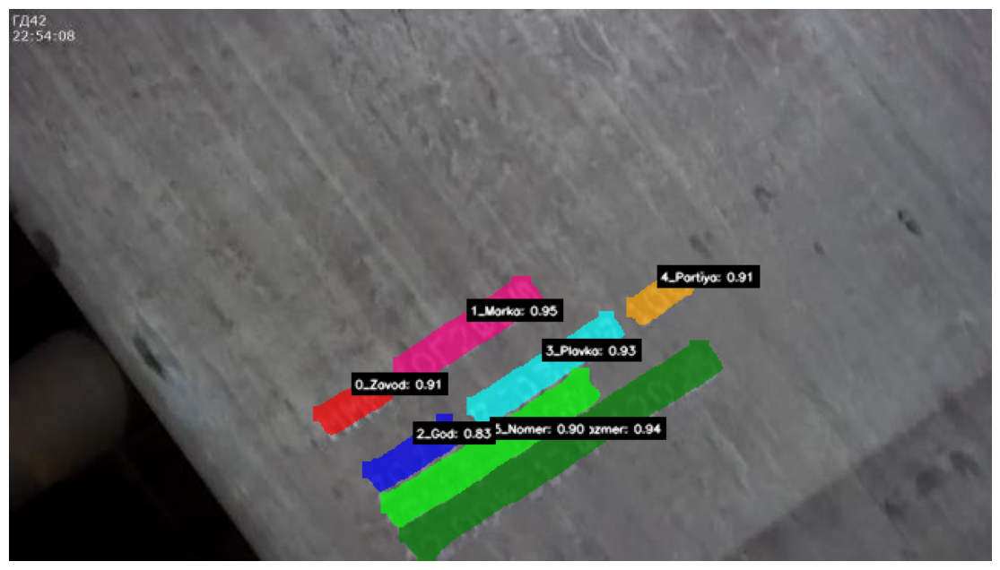

In [44]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'

# Загружаем изображение
image = cv2.imread(image_path)

# Прогоняем через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()


# 🎨 Задаем фиксированные цвета для классов (формат BGR)
colors = {
    '0_Zavod':     [0, 0, 255],      # Красный
    '0_position':  [0, 255, 255],    # Жёлтый
    '0_zakaz':     [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],    # Фиолетовый
    '2_God':       [255, 0, 0],      # Синий
    '3_Plavka':    [255, 255, 0],    # Голубой
    '4_Partiya':   [0, 165, 255],    # Оранжевый
    '5_Nomer':     [0, 255, 0],      # Зелёный
    '6_Razmer':    [0, 128, 0],      # Тёмно-зелёный
    'Yglerod':     [203, 192, 255],  # Розовый
    'stoikost':    [128, 128, 128],  # Серый
}

# Проверка количества объектов
#print(f"Количество предсказанных объектов: {len(res.boxes)}")

text_offset = {}

# Отрисовка масок, названий классов и вероятностей
for box, mask in zip(res.boxes, res.masks.data):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])  # fallback — чёрный
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7  # наложение цвета

    # Центр маски
    M = cv2.moments(mask_bool.astype(np.uint8))
    if M["m00"] > 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
    else:
        x1, y1, _, _ = map(int, box.xyxy[0].cpu().numpy())
        cX, cY = x1, y1  # fallback

    # Группировка по сетке 50x50 пикселей
    grid_x = cX // 50
    grid_y = cY // 50
    group_key = (grid_x, grid_y)

    # Смещение по Y для этой группы
    offset_y = text_offset.get(group_key, 0)
    text_offset[group_key] = offset_y + 1

    # Координаты текста выше маски
    label_y = max(cY - 10 - offset_y * 8, 1)

    

    # Текст
    text = f"{class_name}: {conf:.2f}"
    font_scale = 0.25
    thickness = 1
    (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

    # Фон под текст
    bg_x1 = cX
    bg_y1 = label_y - th - 4
    bg_x2 = cX + tw + 4
    bg_y2 = label_y + 4
    cv2.rectangle(mask_overlay, (bg_x1, bg_y1), (bg_x2, bg_y2), (0, 0, 0), -1)

    # Рисуем текст
    cv2.putText(
        mask_overlay, text, (cX + 2, label_y),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=thickness, lineType=cv2.LINE_AA
    )

# Преобразуем изображение из BGR → RGB для корректного отображения
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))  # Размер окна (ширина x высота в дюймах)
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()


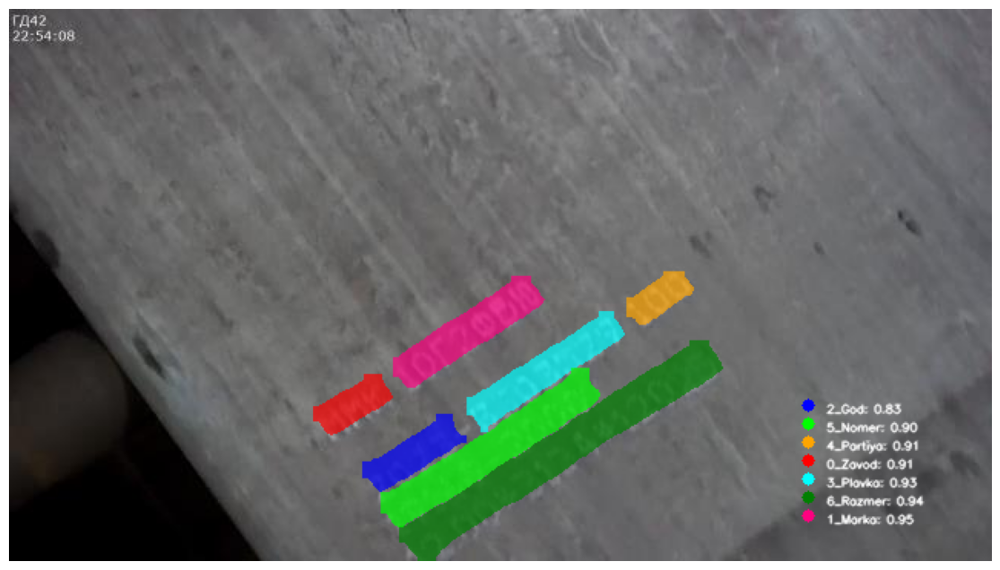

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':     [42, 42, 165],    
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

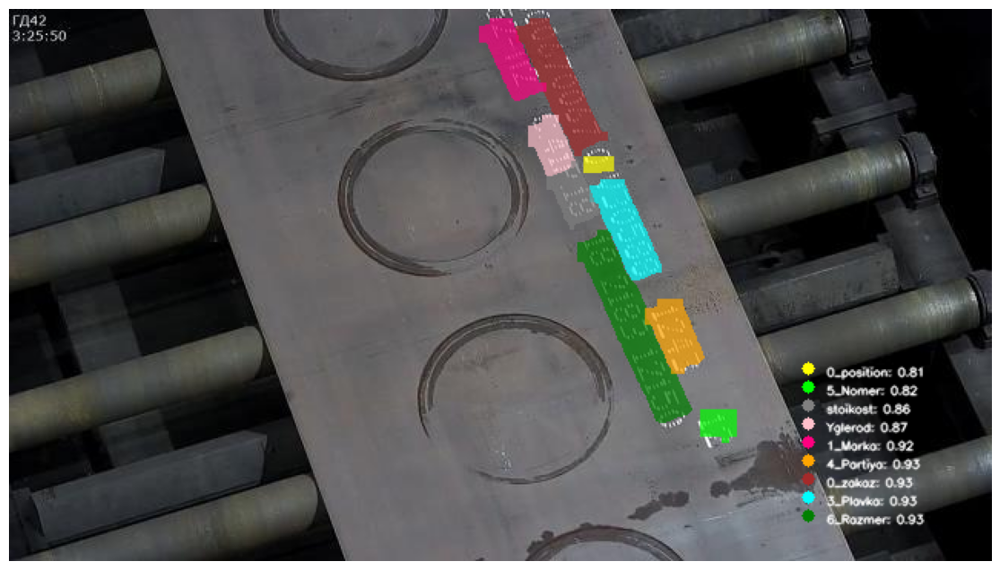

In [47]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-20237-2023-V30588-12_jpg.rf.9319ef99ce107177288210c6131df139.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':      [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

In [49]:
import pandas as pd

# Данные по сегментации (Mask)
data = [
    ['all', '226/1716', 0.97, 0.952, 0.971, 0.735],
    ['0_Zavod', '136/136', 1.0, 0.982, 0.99, 0.811],
    ['0_position', '82/82', 0.825, 0.748, 0.801, 0.338],
    ['0_zakaz', '89/89', 0.992, 0.91, 0.974, 0.746],
    ['1_Marka', '194/194', 0.978, 0.985, 0.987, 0.799],
    ['2_God', '136/136', 0.984, 0.993, 0.995, 0.806],
    ['3_Plavka', '226/226', 0.991, 1.0, 0.995, 0.844],
    ['4_Partiya', '223/223', 0.985, 0.973, 0.994, 0.758],
    ['5_Nomer', '223/223', 0.964, 0.978, 0.991, 0.765],
    ['6_Razmer', '226/228', 0.996, 0.991, 0.995, 0.829],
    ['Yglerod', '89/89', 0.977, 0.941, 0.973, 0.685],
    ['stoikost', '90/90', 0.982, 0.978, 0.989, 0.701]
]

# Названия колонок
columns = ['Class',   'Images/Instances', 'Precision', 'Recall', 'mAP50', 'mAP50-95']

# Создание DataFrame
df_test_yolo11n = pd.DataFrame(data, columns=columns)

# Вычисление F1-меры
df_test_yolo11n["F1-Score"] = 2 * (df_test_yolo11n["Precision"] * df_test_yolo11n["Recall"]) / (df_test_yolo11n["Precision"] + df_test_yolo11n["Recall"])

# Сохранение в CSV
df_test_yolo11n.to_csv('segmentation_metrics_test.csv', index=False)

# Просмотр
#print(df_test)

df_test_yolo11n.style.set_caption("Таблица метрик сегментации по классам")

,Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
0,all,226/1716,0.970000,0.952000,0.971000,0.735000,0.960916
1,0_Zavod,136/136,1.000000,0.982000,0.990000,0.811000,0.990918
2,0_position,82/82,0.825000,0.748000,0.801000,0.338000,0.784615
3,0_zakaz,89/89,0.992000,0.910000,0.974000,0.746000,0.949232
4,1_Marka,194/194,0.978000,0.985000,0.987000,0.799000,0.981488
5,2_God,136/136,0.984000,0.993000,0.995000,0.806000,0.988480
6,3_Plavka,226/226,0.991000,1.000000,0.995000,0.844000,0.995480
7,4_Partiya,223/223,0.985000,0.973000,0.994000,0.758000,0.978963
8,5_Nomer,223/223,0.964000,0.978000,0.991000,0.765000,0.970950
9,6_Razmer,226/228,0.996000,0.991000,0.995000,0.829000,0.993494


In [50]:
# Фильтруем строку с классом 'all'
row_all = df_test_yolo11n[df_test_yolo11n["Class"] == "all"].reset_index(drop=True)

# Скрываем индекс при выводе
row_all.style.set_caption("Средние значения метрик по всем классам").hide(axis="index")


Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
all,226/1716,0.970000,0.952000,0.971000,0.735000,0.960916


## Yolov8

### Yolov8m-seg

In [9]:
model_YOLOv8_m_seg = YOLO('yolov8m-seg.pt')

In [10]:
results = model_YOLOv8_m_seg.train(
    data=base_yolo / "data.yaml",
    epochs=50,
    imgsz=640,
    batch=2,
    device=0
)

New https://pypi.org/project/ultralytics/8.3.111 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
engine\trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\data.yaml, epochs=50, time=None, patience=100, batch=2, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

train: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\labels.cache... 3222 images, 10 backgrou
val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\labels.cache... 228 images, 0 backgro


Plotting labels to runs\segment\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs\segment\train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.26G      1.157      1.728      1.419       1.13         31        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.923      0.862      0.952      0.702      0.886      0.888      0.958      0.654

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.44G     0.9341      1.339     0.7876      1.008         40        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.944      0.944      0.965      0.747      0.932      0.931      0.953      0.663



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.37G      0.897      1.258     0.7186     0.9949         23        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.944      0.952      0.972      0.742      0.935      0.944      0.968      0.673

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.54G     0.8666      1.218     0.6263      0.983         12        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.971      0.962       0.98       0.77      0.965      0.963      0.981      0.691



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.47G     0.8321      1.148     0.5722     0.9689         28        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.963      0.975       0.76      0.975      0.957      0.978      0.692



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.58G     0.8064      1.121     0.5506     0.9599         30        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.967      0.969      0.979      0.769      0.974      0.975      0.986      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.45G     0.8016      1.107     0.5378     0.9564         41        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.963       0.97       0.98      0.778      0.954      0.961       0.97      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.59G     0.7814      1.088     0.4964     0.9467         45        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972       0.96      0.978      0.783       0.97      0.958      0.981      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.47G     0.7656      1.057     0.4745     0.9407         29        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.958      0.978      0.767      0.975      0.962      0.985       0.71



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.43G     0.7626      1.056     0.4742     0.9423         50        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.974      0.979      0.786      0.975      0.965      0.982      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.42G     0.7452      1.027      0.454     0.9373         40        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.97      0.972      0.983      0.793      0.968      0.964       0.98      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.57G     0.7321      1.008     0.4437     0.9299         10        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966      0.968      0.975      0.794      0.968      0.963      0.981      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.52G     0.7228     0.9989     0.4282     0.9255         37        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.974      0.984        0.8      0.977      0.963      0.983      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50       2.5G     0.7231     0.9865     0.4265     0.9244         43        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.971      0.973      0.983      0.798      0.969      0.971      0.984       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.49G     0.7223     0.9944      0.431     0.9297         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974       0.97      0.982      0.798      0.974      0.968      0.986       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.49G     0.7007     0.9684     0.4114      0.918         44        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.969      0.984      0.805      0.972       0.96      0.976      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.52G     0.6913     0.9607     0.3985     0.9143         36        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.969      0.983      0.807      0.969      0.962      0.979       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.59G     0.6931     0.9616     0.3953     0.9139         12        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.977      0.985      0.809       0.97      0.967      0.982      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.46G     0.6878     0.9458     0.3933     0.9137         39        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.979      0.984      0.806      0.972      0.971      0.981      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.49G     0.6813     0.9391     0.3925     0.9122         29        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.974      0.987      0.817      0.968      0.968      0.984      0.738



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.54G     0.6748     0.9242     0.3839     0.9083         43        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.977      0.976      0.985      0.814      0.981      0.972      0.989      0.743



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.46G     0.6595     0.9153     0.3746     0.9037         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.972      0.983      0.818       0.97      0.966      0.978      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.49G     0.6646     0.9163     0.3776     0.9066         37        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.971      0.984      0.815      0.976      0.969      0.986      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.46G     0.6597     0.9019     0.3669     0.9039         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.974      0.987      0.818      0.979      0.975      0.991      0.742



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.49G     0.6602     0.9124      0.371     0.9056         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.975      0.982      0.823      0.967      0.966      0.982      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.47G     0.6499     0.9002     0.3633     0.9004         27        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.968      0.975       0.98       0.82      0.974      0.962      0.983       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.54G     0.6422     0.8831     0.3635     0.8966         29        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.973      0.984      0.823      0.967      0.961      0.975      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.52G     0.6359     0.8764     0.3587     0.8961         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.971      0.978      0.826      0.978      0.965      0.985      0.747



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.52G     0.6325     0.8699     0.3572     0.8927         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.978      0.976      0.983      0.826      0.972      0.969      0.984      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.52G     0.6304      0.871     0.3474     0.8949         21        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.974      0.984      0.831      0.969      0.966      0.981      0.753



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.55G     0.6294     0.8721     0.3516     0.8938         24        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.974      0.981      0.828      0.974      0.973      0.988      0.749



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.58G     0.6184     0.8468     0.3376     0.8885         16        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.981      0.988      0.833      0.981      0.971      0.987      0.756



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.43G     0.6067     0.8357     0.4297     0.8824         24        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.985      0.975      0.986      0.832       0.98      0.972      0.986      0.753



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.49G     0.6136     0.8467     0.3355     0.8858         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.972      0.988      0.831      0.975      0.972      0.986      0.751



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.54G     0.5988     0.8299     0.3282     0.8818         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.978      0.988      0.833      0.973      0.966      0.981      0.748



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.52G     0.5992     0.8251     0.3229     0.8814         47        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.972      0.986      0.839      0.976      0.964      0.986      0.759



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.41G     0.6006     0.8325     0.3244     0.8825         51        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.975      0.987      0.841      0.973      0.969      0.985      0.752



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.51G     0.5917     0.8177     0.3213     0.8805         39        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.974      0.989      0.838      0.974      0.971      0.985      0.754



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.52G      0.594     0.8218     0.3214     0.8791         38        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.979      0.977      0.986      0.842      0.971      0.968      0.985      0.761

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.47G     0.5824     0.8075     0.3122     0.8779         40        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.973      0.986      0.843      0.972      0.967      0.983      0.756


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.47G      0.544     0.7543     0.2842     0.8632         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.981      0.973      0.986      0.845      0.978      0.969      0.986      0.757



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.42G     0.5358     0.7421     0.2828     0.8581          9        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.973      0.986      0.842      0.974      0.976      0.986      0.756



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.47G     0.5312      0.742     0.2783     0.8604         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.986      0.977      0.989       0.84      0.975      0.965       0.98      0.748



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.47G     0.5249     0.7332     0.2725     0.8568         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.977      0.986      0.846      0.977      0.972      0.985      0.758



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.48G     0.5165     0.7253     0.2711     0.8526         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.985      0.979      0.991      0.848      0.973      0.965      0.981      0.753



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.48G     0.5138     0.7205     0.2675     0.8509         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.977      0.991       0.85      0.969      0.967      0.983      0.758



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.51G     0.5071     0.7062     0.2654     0.8492         14        640: 100%|██████████| 1611/1611 [1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.984      0.978      0.991      0.851      0.975       0.97      0.986       0.76



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.47G     0.5005      0.704     0.2623     0.8483         15        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.985      0.975      0.991      0.852      0.975      0.966      0.985      0.759



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.42G     0.4947     0.6942     0.2593     0.8433         12        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.975       0.99      0.851      0.972      0.967      0.984      0.758



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.42G     0.4936     0.6936     0.2582     0.8459         16        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.978      0.973      0.988      0.852      0.971      0.965      0.984      0.762



50 epochs completed in 9.682 hours.
Optimizer stripped from runs\segment\train3\weights\last.pt, 54.8MB
Optimizer stripped from runs\segment\train3\weights\best.pt, 54.8MB

Validating runs\segment\train3\weights\best.pt...
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8m-seg summary (fused): 105 layers, 27,228,753 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.978      0.973      0.988      0.852      0.971      0.965      0.984      0.761
               0_Zavod        137        137      0.995          1      0.995      0.897      0.996          1      0.995      0.813
            0_position         89         89      0.967      0.933      0.959       0.64      0.875      0.843      0.908      0.399
               0_zakaz         86         86      0.976      0.937      0.987      0.882      0.964      0.924      0.985      0.795
               1_Marka        194        194      0.988          1      0.995      0.911      0.979       0.99      0.993      0.815
                 2_God        137        137      0.995          1      0.995      0.869      0.996          1      0.995       0.83
              3_Plavka        228        229      0.987      0.992      0.995      0.921      0.987      0.991      0.995       0.84
             4_Partiya        228        228      0.969      0.968   

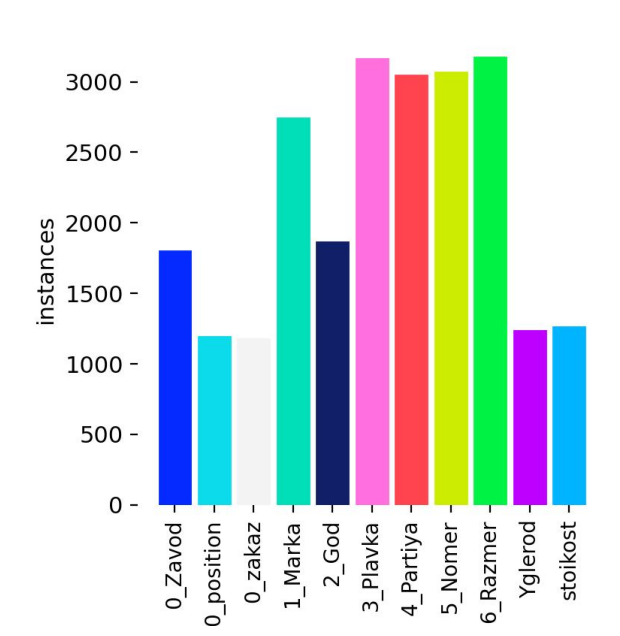

In [29]:
from PIL import Image
import matplotlib.pyplot as plt

# Указываем путь к изображению
img_path = r'D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8m-seg\labels.jpg' 
img = Image.open(img_path)

# Обрезаем изображение, оставляя только гистограмму (левую и верхнюю часть)
left = 0
top = 0
right = img.width // 2  # Оставляем только левую часть
bottom = img.height // 1.95 # Оставляем только верхнюю половину

# Создаем обрезанное изображение
cropped_img = img.crop((left, top, right, bottom))

# Увеличиваем изображение для лучшей видимости
fig, ax = plt.subplots(figsize=(14, 8))  # Увеличиваем размер графика
ax.imshow(cropped_img)
ax.axis('off')  # Отключаем оси
plt.show()

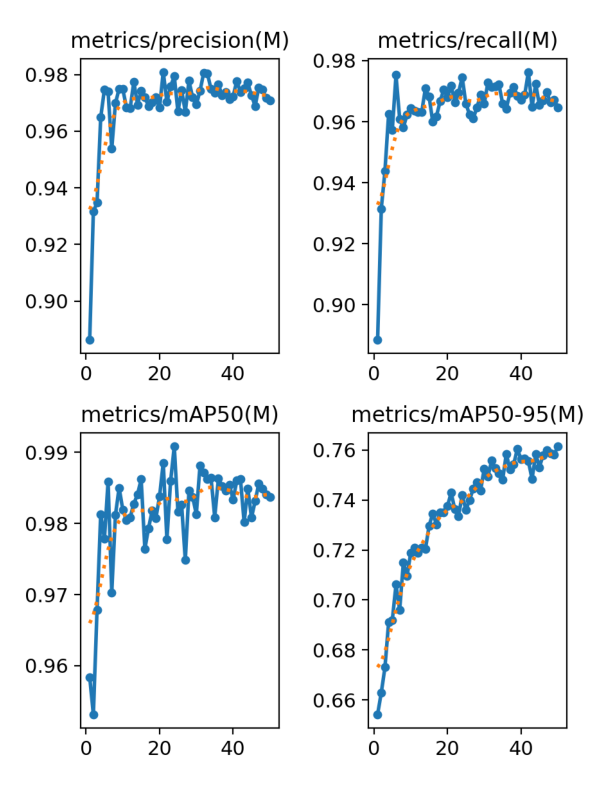

In [20]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8m-seg\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры
width, height = img.size

# Вычисляем координаты обрезки (правые 4 графика = последние 4 / 8 графиков в строке)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# Координаты: 6-й и 7-й графики (сверху) и 6-й и 7-й (снизу)
# Верхний ряд (ряд 0), ячейки 6 и 7
top_left_1 = (cell_width * 6, 0, cell_width * 8, cell_height)

# Нижний ряд (ряд 1), ячейки 6 и 7
top_left_2 = (cell_width * 6, cell_height, cell_width * 8, height)

# Обрезаем и объединяем изображения
upper = img.crop(top_left_1)
lower = img.crop(top_left_2)

# Создаём новое изображение (высота = сумме двух блоков)
combined = Image.new('RGB', (upper.width, upper.height + lower.height))
combined.paste(upper, (0, 0))
combined.paste(lower, (0, upper.height))

# Отображаем
plt.figure(figsize=(20, 10))
plt.imshow(combined)
plt.axis('off')
plt.show()

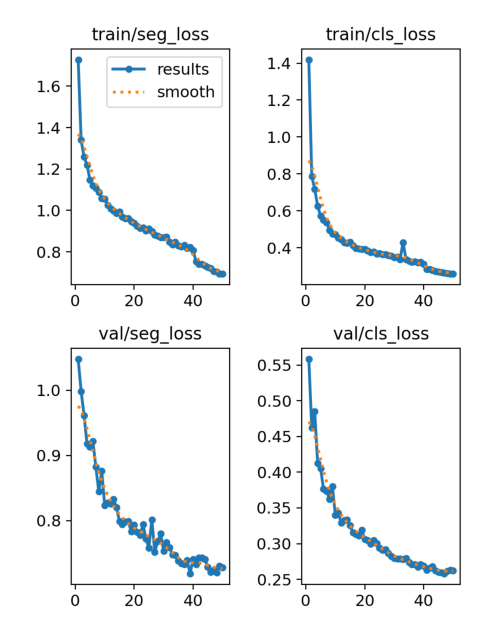

In [21]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8m-seg\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры изображения
width, height = img.size

# Настройка сетки (YOLO рисует 8 графиков в строку, 2 строки)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# --- Вырезаем графики №2 и №3 по порядку (индексы 1 и 2) ---

# Верхний ряд (ряд 0), ячейки 1 и 2
top_crop = (cell_width * 1, 0, cell_width * 3, cell_height)

# Нижний ряд (ряд 1), ячейки 1 и 2
bottom_crop = (cell_width * 1, cell_height, cell_width * 3, height)

# Обрезаем
top_img = img.crop(top_crop)
bottom_img = img.crop(bottom_crop)

# Объединяем два графика вертикально
combined = Image.new('RGB', (top_img.width, top_img.height + bottom_img.height))
combined.paste(top_img, (0, 0))
combined.paste(bottom_img, (0, top_img.height))

# Отображаем
plt.figure(figsize=(12, 8))
plt.imshow(combined)
plt.axis('off')
plt.show()


In [22]:
from ultralytics import YOLO

# Загрузка обученной модели сегментации (YOLOv8) с весами
model_path = "runs/segment/train_yolov8m-seg/weights/best.pt"
model = YOLO(model_path)
print("Модель загружена. Классы:", model.names)

Модель загружена. Классы: {0: '0_Zavod', 1: '0_position', 2: '0_zakaz', 3: '1_Marka', 4: '2_God', 5: '3_Plavka', 6: '4_Partiya', 7: '5_Nomer', 8: '6_Razmer', 9: 'Yglerod', 10: 'stoikost'}


In [23]:
from pathlib import Path
import yaml

# Базовая директория проекта
base_yolo = Path(r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8")

# Пути к test/images и labels (если пригодится позже)
test_images = base_yolo / "test" / "images"
test_labels = base_yolo / "test" / "labels"

# Путь к data.yaml
yaml_path = base_yolo / "data.yaml"

# Загружаем YAML-файл
with open(yaml_path, 'r', encoding='utf-8') as f:
    data = yaml.safe_load(f)

# Добавляем путь к test, если его ещё нет
if 'test' not in data:
    # Относительный путь от data.yaml к test/images
    test_path = test_images.relative_to(base_yolo).as_posix()
    data['test'] = test_path

# Сохраняем изменения
with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data, f, allow_unicode=True)

print(f"✅ Добавлено test: {data['test']} в data.yaml")

✅ Добавлено test: test/images в data.yaml


In [25]:
from ultralytics import YOLO

# Загрузка модели
model = YOLO('runs/segment/train_yolov8m-seg/weights/best.pt')  # путь к .pt

# Запуск тестирования
metrics = model.val(
    data=base_yolo / "data.yaml",   # путь к конфигу
    split='test',       # тестовый набор
    plots=True,         # сохранить графики
    device=0            # можно указать GPU (или 'cpu')
)

Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8m-seg summary (fused): 105 layers, 27,228,753 parameters, 0 gradients, 110.0 GFLOPs


val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\labels.cache... 226 images, 0 backgrounds, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        226       1716      0.977      0.968      0.983      0.857      0.973      0.953      0.974      0.758
               0_Zavod        136        136      0.985      0.987      0.995       0.92      0.988      0.985      0.995      0.855
            0_position         82         82      0.921       0.89      0.918      0.604       0.86      0.805      0.826      0.301
               0_zakaz         89         89          1      0.937      0.995      0.855      0.976      0.896      0.969      0.757
               1_Marka        194        194      0.983      0.985      0.991      0.918      0.976      0.974      0.986      0.824
                 2_God        136        136      0.982      0.993      0.995      0.891      0.984      0.993      0.995      0.828
              3_Plavka        226        226          1      0.998      0.995      0.948          1      0.994      0.995      0.869
             4_Partiya        223        223      0.987       0.99   

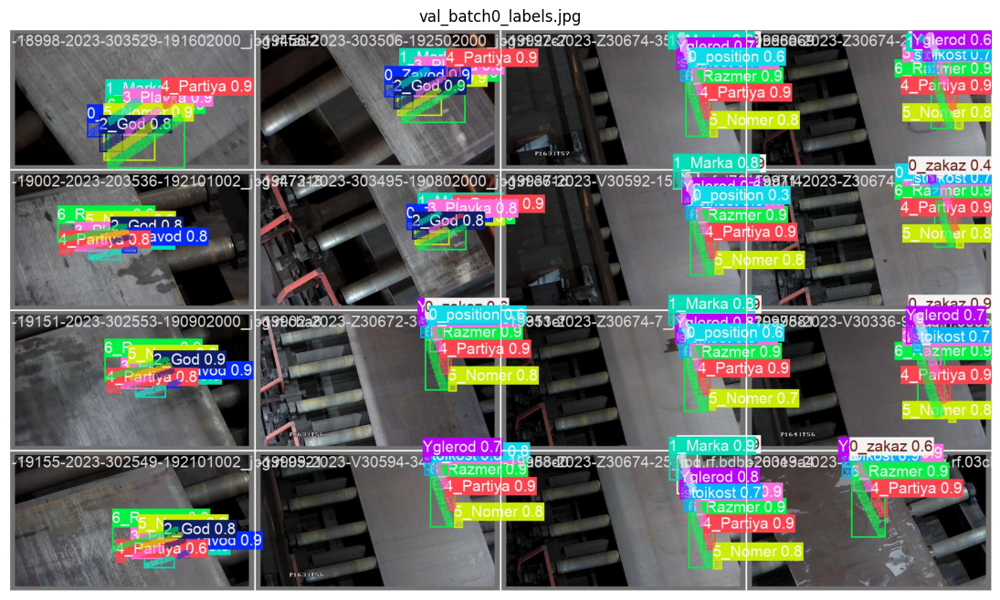

In [26]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8m-seg'

# Путь к изображению
image_path = os.path.join(val_images_path, 'val_batch0_pred.jpg')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

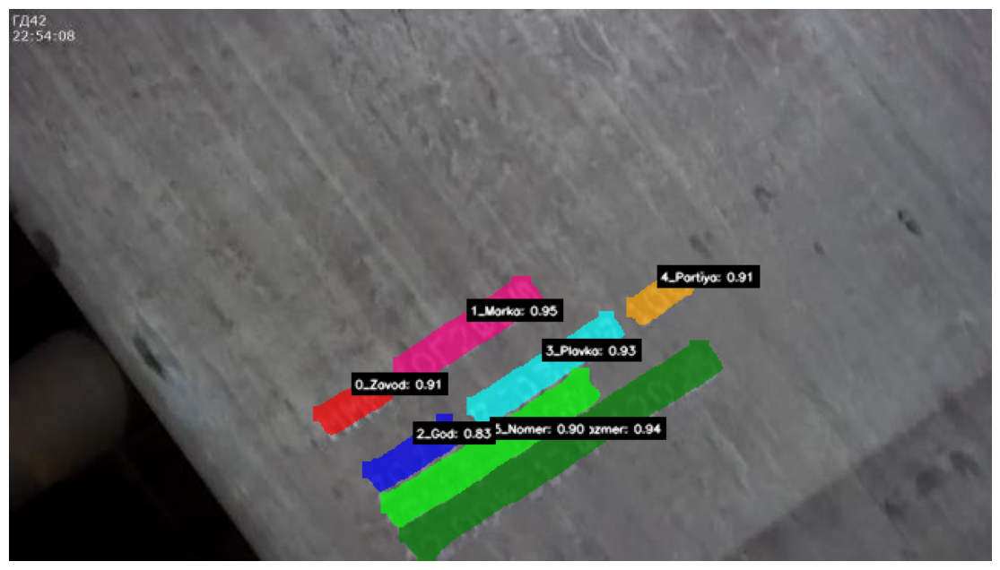

In [27]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'

# Загружаем изображение
image = cv2.imread(image_path)

# Прогоняем через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()


# 🎨 Задаем фиксированные цвета для классов (формат BGR)
colors = {
    '0_Zavod':     [0, 0, 255],      # Красный
    '0_position':  [0, 255, 255],    # Жёлтый
    '0_zakaz':     [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],    # Фиолетовый
    '2_God':       [255, 0, 0],      # Синий
    '3_Plavka':    [255, 255, 0],    # Голубой
    '4_Partiya':   [0, 165, 255],    # Оранжевый
    '5_Nomer':     [0, 255, 0],      # Зелёный
    '6_Razmer':    [0, 128, 0],      # Тёмно-зелёный
    'Yglerod':     [203, 192, 255],  # Розовый
    'stoikost':    [128, 128, 128],  # Серый
}

# Проверка количества объектов
#print(f"Количество предсказанных объектов: {len(res.boxes)}")

text_offset = {}

# Отрисовка масок, названий классов и вероятностей
for box, mask in zip(res.boxes, res.masks.data):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])  # fallback — чёрный
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7  # наложение цвета

    # Центр маски
    M = cv2.moments(mask_bool.astype(np.uint8))
    if M["m00"] > 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
    else:
        x1, y1, _, _ = map(int, box.xyxy[0].cpu().numpy())
        cX, cY = x1, y1  # fallback

    # Группировка по сетке 50x50 пикселей
    grid_x = cX // 50
    grid_y = cY // 50
    group_key = (grid_x, grid_y)

    # Смещение по Y для этой группы
    offset_y = text_offset.get(group_key, 0)
    text_offset[group_key] = offset_y + 1

    # Координаты текста выше маски
    label_y = max(cY - 10 - offset_y * 8, 1)

    

    # Текст
    text = f"{class_name}: {conf:.2f}"
    font_scale = 0.25
    thickness = 1
    (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

    # Фон под текст
    bg_x1 = cX
    bg_y1 = label_y - th - 4
    bg_x2 = cX + tw + 4
    bg_y2 = label_y + 4
    cv2.rectangle(mask_overlay, (bg_x1, bg_y1), (bg_x2, bg_y2), (0, 0, 0), -1)

    # Рисуем текст
    cv2.putText(
        mask_overlay, text, (cX + 2, label_y),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=thickness, lineType=cv2.LINE_AA
    )

# Преобразуем изображение из BGR → RGB для корректного отображения
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))  # Размер окна (ширина x высота в дюймах)
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

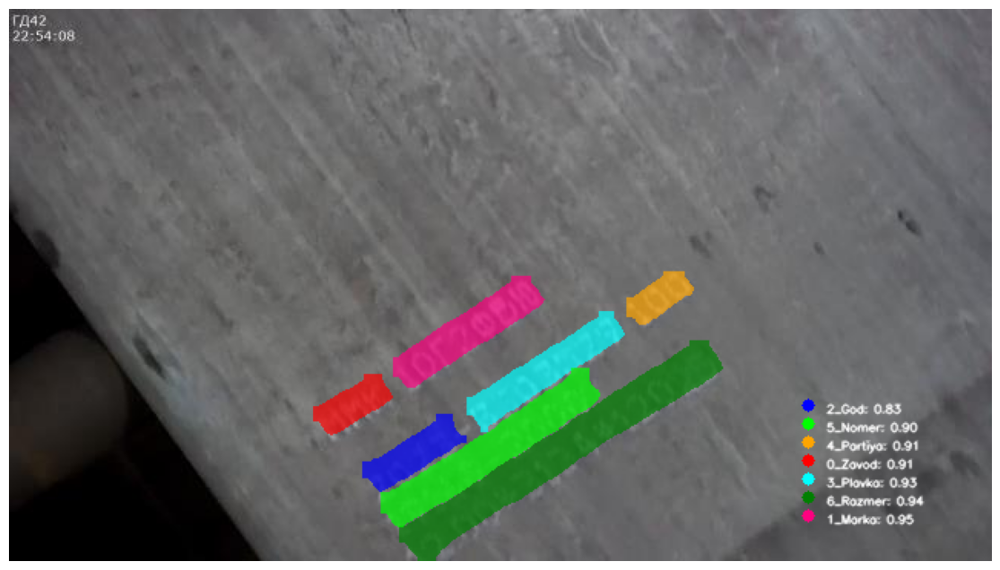

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':     [42, 42, 165],    
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

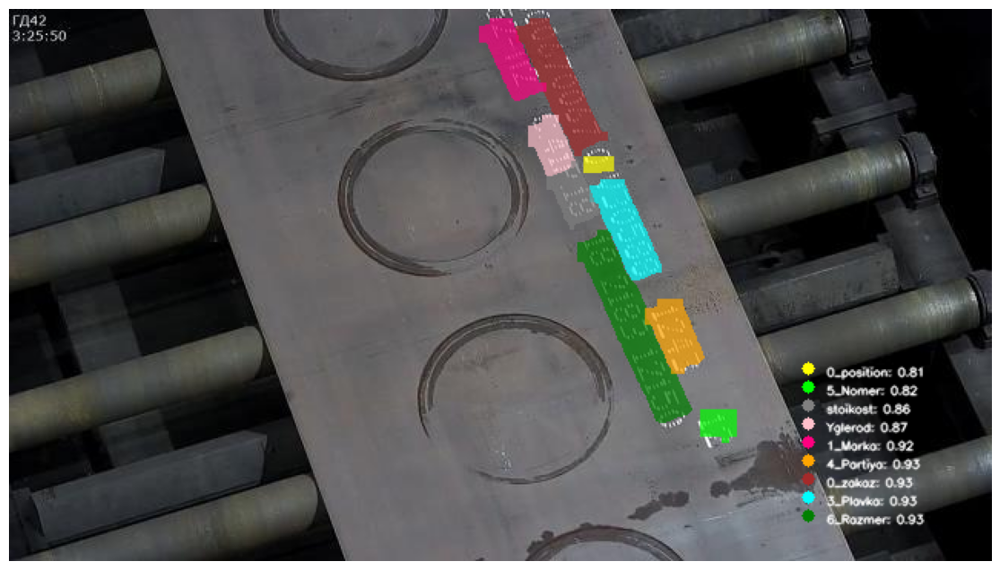

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-20237-2023-V30588-12_jpg.rf.9319ef99ce107177288210c6131df139.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':      [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

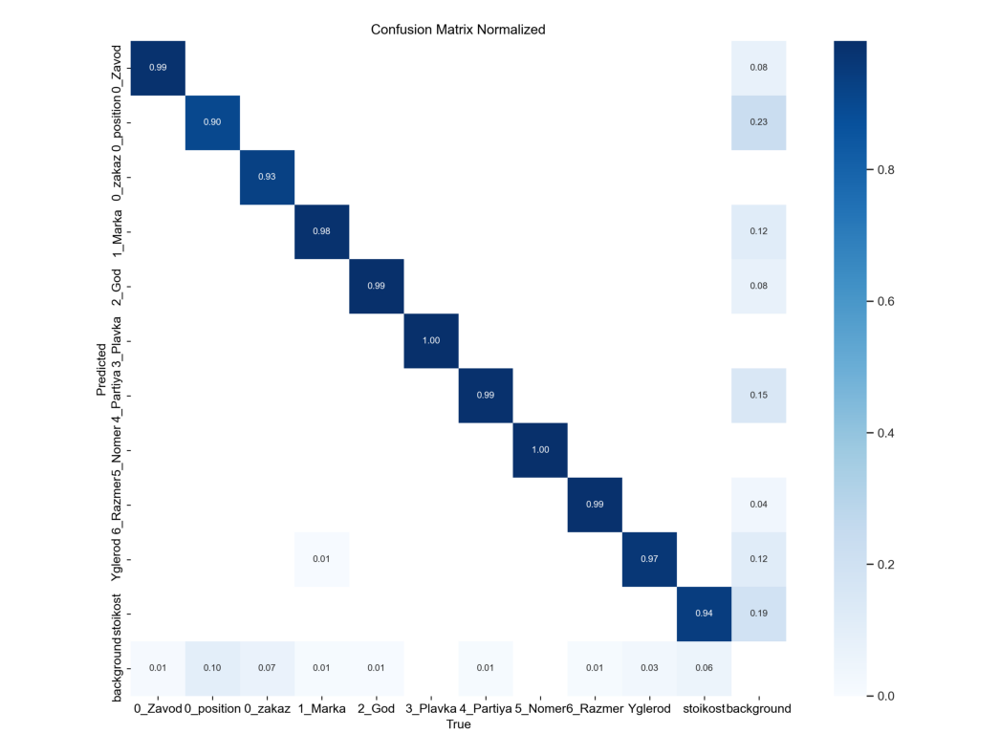

In [32]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from PIL import Image

# Указываем путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8m-seg\confusion_matrix_normalized.png"

# Загружаем изображение
img = Image.open(img_path)

# Показываем изображение с увеличенным размером
plt.figure(figsize=(20, 10))  # Увеличим размер графика
plt.imshow(img)
plt.axis('off')  # Отключаем оси
plt.show()  # Один раз что измеить в коде

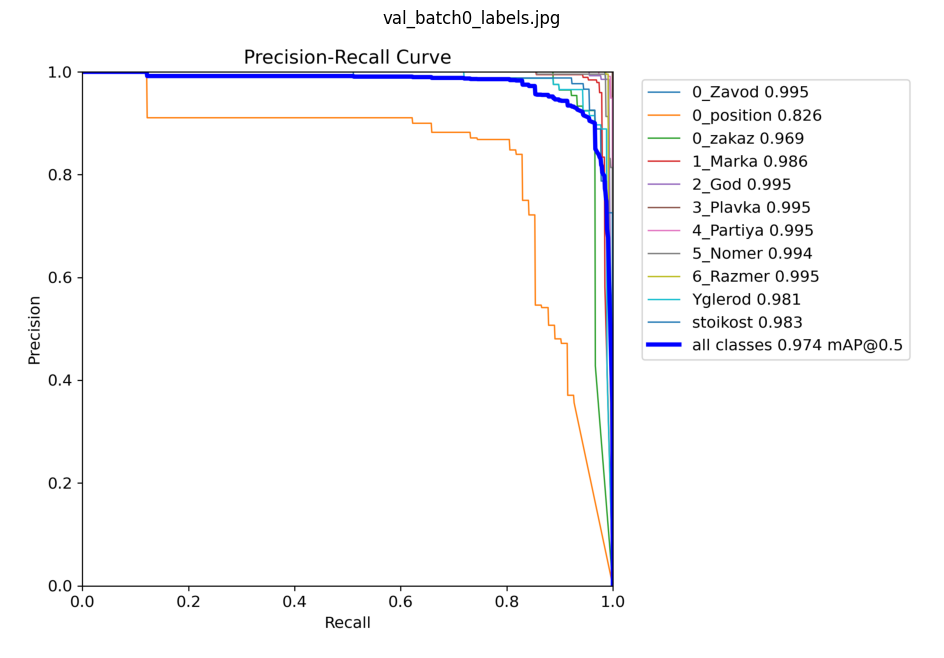

In [33]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8m-seg'

# Путь к изображению
image_path = os.path.join(val_images_path, 'MaskPR_curve.png')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

In [35]:
import pandas as pd

# Данные по сегментации (Mask)
data = [
    ['all', '226/1716',   0.973, 0.953, 0.974, 0.758],
    ['0_Zavod', '136/136', 0.988, 0.985, 0.995, 0.855],
    ['0_position', '82/82', 0.86, 0.805, 0.826, 0.301],
    ['0_zakaz', '89/89', 0.976, 0.896, 0.969, 0.757],
    ['1_Marka', '194/194', 0.976, 0.974, 0.986, 0.824],
    ['2_God', '136/136', 0.984, 0.993, 0.995, 0.828],
    ['3_Plavka', '226/226',   1, 0.994, 0.995, 0.869],
    ['4_Partiya', '223/223', 0.995, 0.99, 0.995, 0.796],
    ['5_Nomer', '223/223',  0.993, 0.987, 0.994, 0.793],
    ['6_Razmer', '226/228', 0.995, 0.991, 0.995, 0.85],
    ['Yglerod', '89/89', 0.965, 0.929, 0.981, 0.727],
    ['stoikost', '90/90', 0.971, 0.944, 0.983, 0.738]
]

# Названия колонок
columns = ['Class',   'Images/Instances', 'Precision', 'Recall', 'mAP50', 'mAP50-95']

# Создание DataFrame
df_test_yolov8m = pd.DataFrame(data, columns=columns)

# Вычисление F1-меры
df_test_yolov8m["F1-Score"] = 2 * (df_test_yolov8m["Precision"] * df_test_yolov8m["Recall"]) / (df_test_yolov8m["Precision"] + df_test_yolov8m["Recall"])

# Сохранение в CSV
df_test_yolov8m.to_csv('segmentation_metrics_test.csv', index=False)

# Просмотр
#print(df_test)

df_test_yolov8m.style.set_caption("Таблица метрик сегментации по классам")

,Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
0,all,226/1716,0.973000,0.953000,0.974000,0.758000,0.962896
1,0_Zavod,136/136,0.988000,0.985000,0.995000,0.855000,0.986498
2,0_position,82/82,0.860000,0.805000,0.826000,0.301000,0.831592
3,0_zakaz,89/89,0.976000,0.896000,0.969000,0.757000,0.934291
4,1_Marka,194/194,0.976000,0.974000,0.986000,0.824000,0.974999
5,2_God,136/136,0.984000,0.993000,0.995000,0.828000,0.988480
6,3_Plavka,226/226,1.000000,0.994000,0.995000,0.869000,0.996991
7,4_Partiya,223/223,0.995000,0.990000,0.995000,0.796000,0.992494
8,5_Nomer,223/223,0.993000,0.987000,0.994000,0.793000,0.989991
9,6_Razmer,226/228,0.995000,0.991000,0.995000,0.850000,0.992996


In [36]:
# Фильтруем строку с классом 'all'
row_all = df_test_yolov8m[df_test_yolov8m["Class"] == "all"].reset_index(drop=True)

# Скрываем индекс при выводе
row_all.style.set_caption("Средние значения метрик по всем классам").hide(axis="index")


Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
all,226/1716,0.973000,0.953000,0.974000,0.758000,0.962896


### Yolov8n-seg

In [7]:
model_YOLOv8_n_seg = YOLO('yolov8n-seg.pt')

100%|█████████████████████████████████████████████████████████████████████████████| 6.74M/6.74M [00:00<00:00, 22.2MB/s]


In [8]:
results = model_YOLOv8_n_seg.train(
    data=base_yolo / "data.yaml",
    epochs=50,
    imgsz=640,
    batch=2,
    device=0
)

New https://pypi.org/project/ultralytics/8.3.111 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
engine\trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\data.yaml, epochs=50, time=None, patience=100, batch=1, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

train: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\labels.cache... 3222 images, 10 backgrou
val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\labels.cache... 228 images, 0 backgro


Plotting labels to runs\segment\train2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs\segment\train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.537G      1.636       2.38       2.93      1.269         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.817      0.642      0.764      0.545      0.821      0.646      0.773      0.494



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.549G       1.23      1.705      1.763      1.063         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.855      0.832      0.903      0.644      0.877      0.828      0.914      0.604



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.549G      1.124      1.555      1.362       1.02         17        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.888      0.867       0.93      0.694      0.888      0.874      0.934      0.632



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.611G      1.067      1.455      1.156     0.9986          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.91      0.901      0.943      0.705      0.923      0.905      0.954      0.649



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.611G      1.015      1.386      1.029     0.9772          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.941       0.89      0.956      0.718      0.936      0.885      0.947      0.647



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.611G      0.999      1.366     0.9923     0.9765         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.923      0.914      0.962       0.72      0.911      0.905      0.946      0.657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.611G     0.9678      1.325     0.9195     0.9605          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.933      0.927      0.966      0.737      0.931      0.928      0.966       0.67



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.611G     0.9539      1.293     0.8923     0.9551         29        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.939      0.937      0.965      0.734      0.946      0.932      0.973      0.682



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.611G     0.9356      1.279     0.8058     0.9508          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.943      0.949      0.973      0.747      0.943      0.947      0.971      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.611G     0.9182      1.254     0.7711     0.9439          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.964      0.943      0.968       0.75      0.957      0.949      0.971      0.688



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.611G     0.8931      1.217      0.756     0.9381          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735       0.96      0.953      0.975      0.748      0.965       0.95      0.976      0.686

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.611G     0.8843      1.197     0.7105     0.9342          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.956      0.979      0.757      0.978      0.964      0.987      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.611G     0.8875      1.192     0.6984     0.9323          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.954      0.954       0.97      0.758       0.96      0.961      0.981      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.611G     0.8613      1.167      0.668     0.9239         28        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966      0.959      0.979      0.762      0.971      0.965      0.984      0.707



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.611G     0.8621       1.17      0.723      0.927          8        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.927      0.939      0.966       0.75      0.929      0.941      0.972      0.687



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.611G     0.8501      1.163     0.6818     0.9263         28        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.96      0.945      0.972      0.759      0.963      0.941      0.972        0.7



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.611G     0.8432      1.152      0.672     0.9195          4        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.961      0.968      0.978      0.757      0.959      0.958      0.978      0.685



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.611G     0.8446      1.138     0.6652     0.9261         13        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.975       0.96      0.976      0.765      0.984      0.968      0.988      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.611G     0.8284      1.133     0.6551     0.9179          6        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.971      0.961      0.975      0.762      0.976      0.968      0.984      0.702



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.611G     0.8121      1.112      0.619     0.9159         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.975      0.955      0.982      0.769      0.973      0.952      0.977      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.611G     0.8265      1.126     0.6097     0.9175         32        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.956      0.956      0.975      0.775      0.967      0.961      0.983      0.709

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.611G     0.8123      1.105     0.6155      0.913         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.975      0.961      0.978      0.783      0.975       0.96      0.981      0.713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.611G     0.8111      1.106     0.5994      0.913         14        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.969      0.965      0.981      0.775      0.984      0.953      0.986      0.707



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.611G     0.8051      1.104     0.5831     0.9122          2        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966      0.964       0.98      0.778      0.968      0.962      0.982      0.708



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.611G      0.789      1.082     0.5677     0.9063          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.964      0.983      0.783      0.977      0.962      0.983      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.611G     0.7955      1.083     0.5785     0.9099         11        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.965       0.97       0.98      0.787      0.973       0.96      0.983      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.611G     0.7888       1.09     0.5573     0.9035          9        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.962      0.981      0.783      0.981      0.967      0.988      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.611G     0.7686      1.056       0.56     0.8982         16        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.968      0.986      0.785      0.973      0.962      0.983      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.611G      0.781      1.072     0.5501     0.9039         20        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.97      0.959      0.978      0.785      0.974      0.965      0.985      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.611G     0.7667      1.048     0.5415     0.8981         15        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.973      0.969      0.983      0.792      0.969      0.969      0.984      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.611G     0.7691      1.053      0.567     0.9015         24        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974      0.967      0.983      0.784      0.974      0.965      0.983      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.611G     0.7653      1.048     0.5293     0.9003         14        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.966      0.969      0.984      0.789      0.972      0.967      0.988      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.611G     0.7633       1.04     0.5439     0.8988          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.963      0.981       0.79      0.984      0.967      0.988      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.611G     0.7504       1.03     0.5138     0.8928          7        640: 100%|██████████| 3222/3222 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735       0.97       0.97      0.981      0.792      0.969      0.969      0.983      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.611G     0.7599      1.042     0.5462     0.8948         12        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.978      0.969      0.983      0.793      0.979      0.969      0.986      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.611G     0.7432      1.026     0.5174     0.8943         34        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.978      0.969      0.985       0.79      0.978      0.969      0.987      0.726



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.611G     0.7425      1.022     0.5166     0.8914         10        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.977       0.97      0.986      0.793       0.98       0.97      0.989      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.611G     0.7326      1.007     0.5087     0.8879         10        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.974      0.972      0.983      0.794      0.977      0.961      0.982      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.611G     0.7399      1.015     0.5398     0.8924          5        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.983      0.969      0.985      0.797      0.986      0.971      0.989      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.611G     0.7332      1.014     0.4978     0.8906         15        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.978      0.968       0.98      0.798      0.979      0.963       0.98       0.73


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.611G     0.7057      0.956     0.4842     0.8758          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735       0.98      0.965      0.983      0.797      0.983      0.969      0.988      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.611G     0.6912     0.9498     0.4674     0.8711          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.976       0.96      0.982      0.797      0.977       0.96      0.984      0.726



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.611G     0.6806     0.9276      0.454     0.8724          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.982      0.969      0.984        0.8      0.984      0.969      0.987      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.611G     0.6759     0.9174     0.4447     0.8706          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.975      0.966      0.983      0.803      0.981      0.966      0.987      0.733



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.611G     0.6672     0.9177     0.4372     0.8677          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.979       0.97      0.983      0.799      0.978      0.969      0.984      0.731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.611G     0.6628     0.9104     0.4329     0.8659          9        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.978      0.962      0.982      0.803      0.976       0.96      0.981      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.611G     0.6599      0.908     0.4294     0.8653          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.977       0.97      0.986      0.803      0.976      0.971      0.985      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.611G     0.6565     0.9008     0.4193     0.8631          7        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.978      0.967      0.984      0.803      0.982      0.963      0.986      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.611G     0.6537     0.9012     0.4268     0.8622          6        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.976      0.971      0.984      0.805      0.977      0.973      0.987      0.738



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.611G     0.6486     0.8959     0.4228     0.8632          9        640: 100%|██████████| 3222
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 

                   all        228       1735      0.975      0.969      0.983      0.807      0.979      0.965      0.984      0.736



50 epochs completed in 6.695 hours.
Optimizer stripped from runs\segment\train2\weights\last.pt, 6.8MB
Optimizer stripped from runs\segment\train2\weights\best.pt, 6.8MB

Validating runs\segment\train2\weights\best.pt...
Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,260,209 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R 


                   all        228       1735      0.975      0.969      0.983      0.807      0.979      0.965      0.984      0.737
               0_Zavod        137        137      0.996          1      0.995      0.885      0.997          1      0.995      0.803
            0_position         89         89      0.976       0.92       0.95      0.555      0.928      0.871      0.917        0.4
               0_zakaz         86         86      0.964       0.94      0.978      0.851      0.964      0.935      0.984      0.777
               1_Marka        194        194       0.99      0.978      0.994      0.892       0.99      0.975      0.994      0.798
                 2_God        137        137      0.995          1      0.995      0.829      0.996          1      0.995      0.778
              3_Plavka        228        229      0.987      0.989      0.995      0.888      0.991      0.991      0.995      0.809
             4_Partiya        228        228      0.975      0.961   

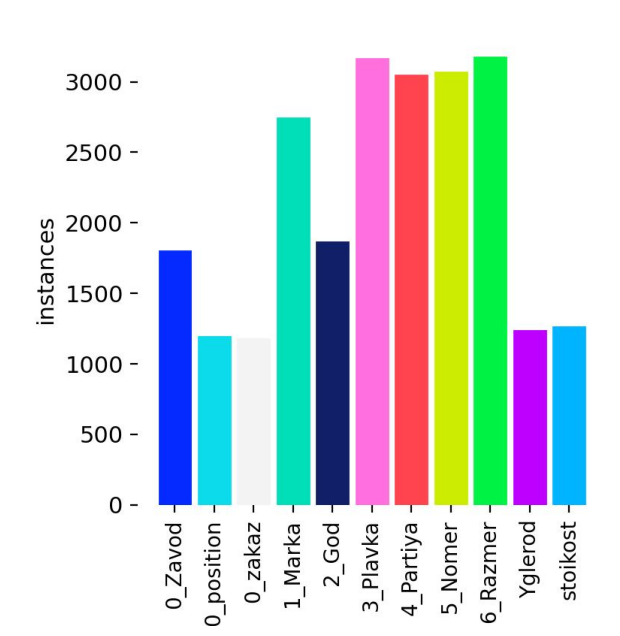

In [30]:
from PIL import Image
import matplotlib.pyplot as plt

# Указываем путь к изображению
img_path = r'D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8m-seg\labels.jpg' 
img = Image.open(img_path)

# Обрезаем изображение, оставляя только гистограмму (левую и верхнюю часть)
left = 0
top = 0
right = img.width // 2  # Оставляем только левую часть
bottom = img.height // 1.95 # Оставляем только верхнюю половину

# Создаем обрезанное изображение
cropped_img = img.crop((left, top, right, bottom))

# Увеличиваем изображение для лучшей видимости
fig, ax = plt.subplots(figsize=(14, 8))  # Увеличиваем размер графика
ax.imshow(cropped_img)
ax.axis('off')  # Отключаем оси
plt.show()

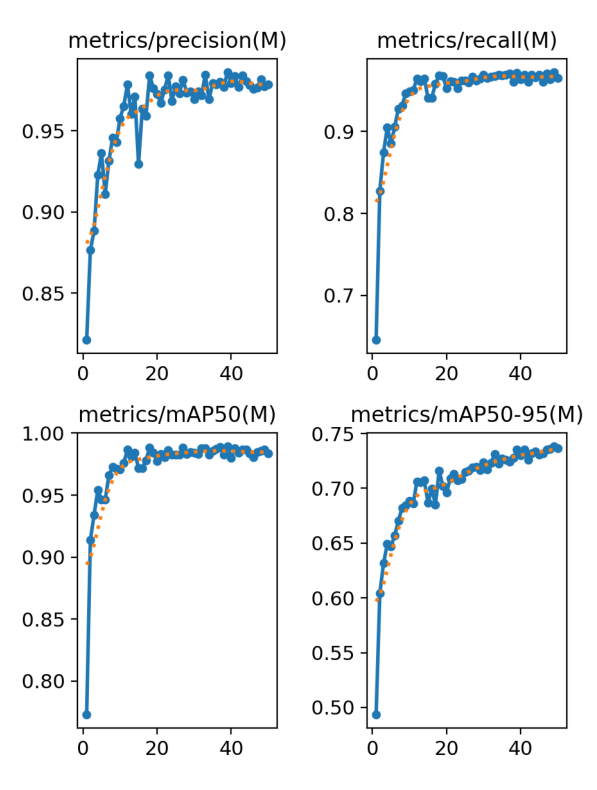

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8n-seg\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры
width, height = img.size

# Вычисляем координаты обрезки (правые 4 графика = последние 4 / 8 графиков в строке)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# Координаты: 6-й и 7-й графики (сверху) и 6-й и 7-й (снизу)
# Верхний ряд (ряд 0), ячейки 6 и 7
top_left_1 = (cell_width * 6, 0, cell_width * 8, cell_height)

# Нижний ряд (ряд 1), ячейки 6 и 7
top_left_2 = (cell_width * 6, cell_height, cell_width * 8, height)

# Обрезаем и объединяем изображения
upper = img.crop(top_left_1)
lower = img.crop(top_left_2)

# Создаём новое изображение (высота = сумме двух блоков)
combined = Image.new('RGB', (upper.width, upper.height + lower.height))
combined.paste(upper, (0, 0))
combined.paste(lower, (0, upper.height))

# Отображаем
plt.figure(figsize=(20, 10))
plt.imshow(combined)
plt.axis('off')
plt.show()

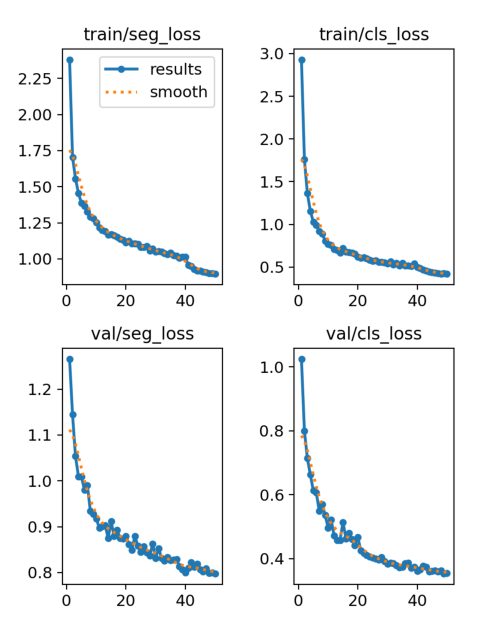

In [3]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train_yolov8n-seg\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры изображения
width, height = img.size

# Настройка сетки (YOLO рисует 8 графиков в строку, 2 строки)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# --- Вырезаем графики №2 и №3 по порядку (индексы 1 и 2) ---

# Верхний ряд (ряд 0), ячейки 1 и 2
top_crop = (cell_width * 1, 0, cell_width * 3, cell_height)

# Нижний ряд (ряд 1), ячейки 1 и 2
bottom_crop = (cell_width * 1, cell_height, cell_width * 3, height)

# Обрезаем
top_img = img.crop(top_crop)
bottom_img = img.crop(bottom_crop)

# Объединяем два графика вертикально
combined = Image.new('RGB', (top_img.width, top_img.height + bottom_img.height))
combined.paste(top_img, (0, 0))
combined.paste(bottom_img, (0, top_img.height))

# Отображаем
plt.figure(figsize=(12, 8))
plt.imshow(combined)
plt.axis('off')
plt.show()


In [4]:
from ultralytics import YOLO

# Загрузка обученной модели сегментации (YOLOv8) с весами
model_path = "runs/segment/train_yolov8n-seg/weights/best.pt"
model = YOLO(model_path)
print("Модель загружена. Классы:", model.names)

Модель загружена. Классы: {0: '0_Zavod', 1: '0_position', 2: '0_zakaz', 3: '1_Marka', 4: '2_God', 5: '3_Plavka', 6: '4_Partiya', 7: '5_Nomer', 8: '6_Razmer', 9: 'Yglerod', 10: 'stoikost'}


In [5]:
from pathlib import Path
import yaml

# Базовая директория проекта
base_yolo = Path(r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8")

# Пути к test/images и labels (если пригодится позже)
test_images = base_yolo / "test" / "images"
test_labels = base_yolo / "test" / "labels"

# Путь к data.yaml
yaml_path = base_yolo / "data.yaml"

# Загружаем YAML-файл
with open(yaml_path, 'r', encoding='utf-8') as f:
    data = yaml.safe_load(f)

# Добавляем путь к test, если его ещё нет
if 'test' not in data:
    # Относительный путь от data.yaml к test/images
    test_path = test_images.relative_to(base_yolo).as_posix()
    data['test'] = test_path

# Сохраняем изменения
with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data, f, allow_unicode=True)

print(f"✅ Добавлено test: {data['test']} в data.yaml")

✅ Добавлено test: test/images в data.yaml


In [6]:
from ultralytics import YOLO

# Загрузка модели
model = YOLO('runs/segment/train_yolov8n-seg/weights/best.pt')  # путь к .pt

# Запуск тестирования
metrics = model.val(
    data=base_yolo / "data.yaml",   # путь к конфигу
    split='test',       # тестовый набор
    plots=True,         # сохранить графики
    device=0            # можно указать GPU (или 'cpu')
)

Ultralytics 8.3.109  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,260,209 parameters, 0 gradients, 12.0 GFLOPs


val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\labels.cache... 226 images, 0 backgrounds, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        226       1716      0.974      0.963      0.978      0.816      0.972      0.951      0.972      0.735
               0_Zavod        136        136      0.991      0.985      0.991      0.878      0.992      0.985      0.991      0.815
            0_position         82         82      0.885       0.89      0.896      0.533      0.786       0.76      0.777      0.281
               0_zakaz         89         89          1      0.921      0.983      0.821          1      0.918      0.991      0.743
               1_Marka        194        194      0.979      0.979      0.994       0.89       0.99      0.973      0.993      0.807
                 2_God        136        136      0.988      0.993      0.995      0.865       0.99      0.993      0.995      0.811
              3_Plavka        226        226      0.994          1      0.995      0.928      0.996          1      0.995      0.844
             4_Partiya        223        223      0.986      0.967   

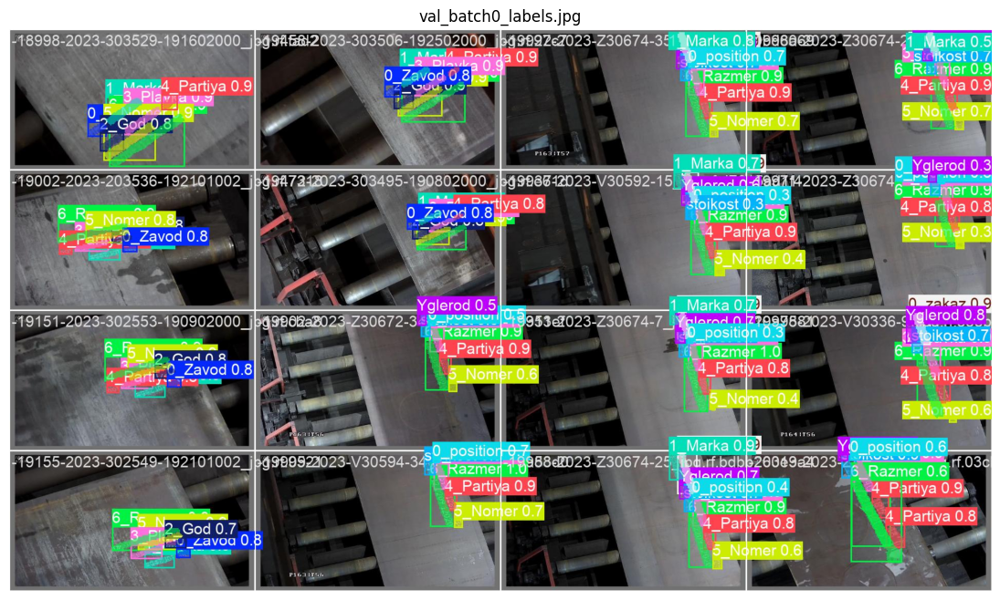

In [7]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8n-seg'

# Путь к изображению
image_path = os.path.join(val_images_path, 'val_batch0_pred.jpg')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

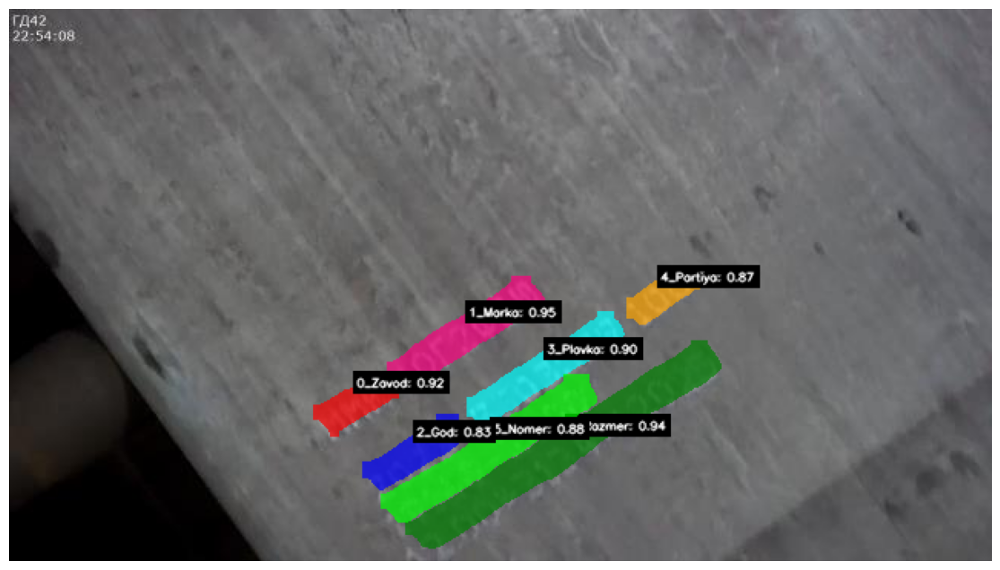

In [8]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'

# Загружаем изображение
image = cv2.imread(image_path)

# Прогоняем через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()


# 🎨 Задаем фиксированные цвета для классов (формат BGR)
colors = {
    '0_Zavod':     [0, 0, 255],      # Красный
    '0_position':  [0, 255, 255],    # Жёлтый
    '0_zakaz':     [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],    # Фиолетовый
    '2_God':       [255, 0, 0],      # Синий
    '3_Plavka':    [255, 255, 0],    # Голубой
    '4_Partiya':   [0, 165, 255],    # Оранжевый
    '5_Nomer':     [0, 255, 0],      # Зелёный
    '6_Razmer':    [0, 128, 0],      # Тёмно-зелёный
    'Yglerod':     [203, 192, 255],  # Розовый
    'stoikost':    [128, 128, 128],  # Серый
}

# Проверка количества объектов
#print(f"Количество предсказанных объектов: {len(res.boxes)}")

text_offset = {}

# Отрисовка масок, названий классов и вероятностей
for box, mask in zip(res.boxes, res.masks.data):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])  # fallback — чёрный
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7  # наложение цвета

    # Центр маски
    M = cv2.moments(mask_bool.astype(np.uint8))
    if M["m00"] > 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
    else:
        x1, y1, _, _ = map(int, box.xyxy[0].cpu().numpy())
        cX, cY = x1, y1  # fallback

    # Группировка по сетке 50x50 пикселей
    grid_x = cX // 50
    grid_y = cY // 50
    group_key = (grid_x, grid_y)

    # Смещение по Y для этой группы
    offset_y = text_offset.get(group_key, 0)
    text_offset[group_key] = offset_y + 1

    # Координаты текста выше маски
    label_y = max(cY - 10 - offset_y * 8, 1)

    

    # Текст
    text = f"{class_name}: {conf:.2f}"
    font_scale = 0.25
    thickness = 1
    (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

    # Фон под текст
    bg_x1 = cX
    bg_y1 = label_y - th - 4
    bg_x2 = cX + tw + 4
    bg_y2 = label_y + 4
    cv2.rectangle(mask_overlay, (bg_x1, bg_y1), (bg_x2, bg_y2), (0, 0, 0), -1)

    # Рисуем текст
    cv2.putText(
        mask_overlay, text, (cX + 2, label_y),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=thickness, lineType=cv2.LINE_AA
    )

# Преобразуем изображение из BGR → RGB для корректного отображения
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))  # Размер окна (ширина x высота в дюймах)
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

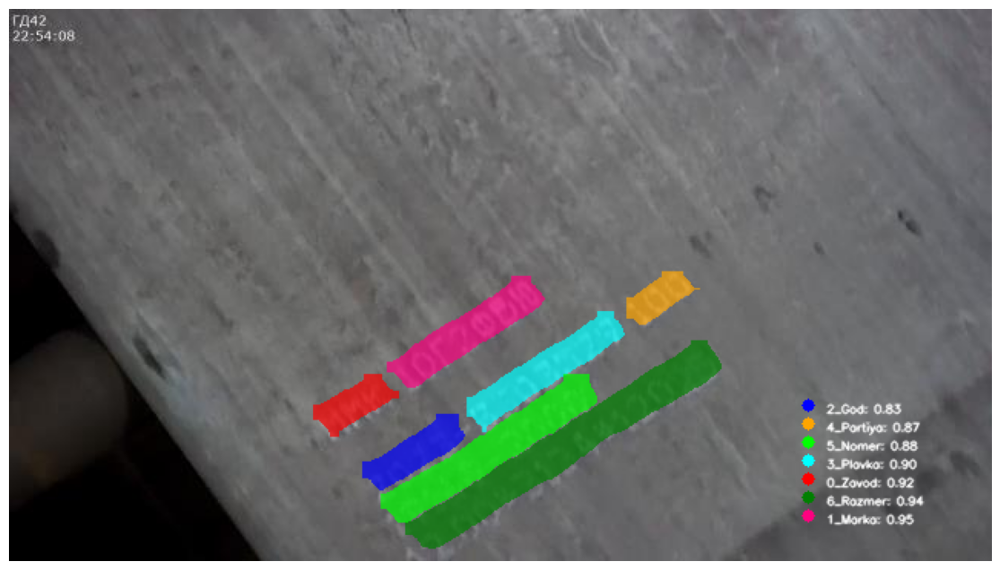

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':     [42, 42, 165],    
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

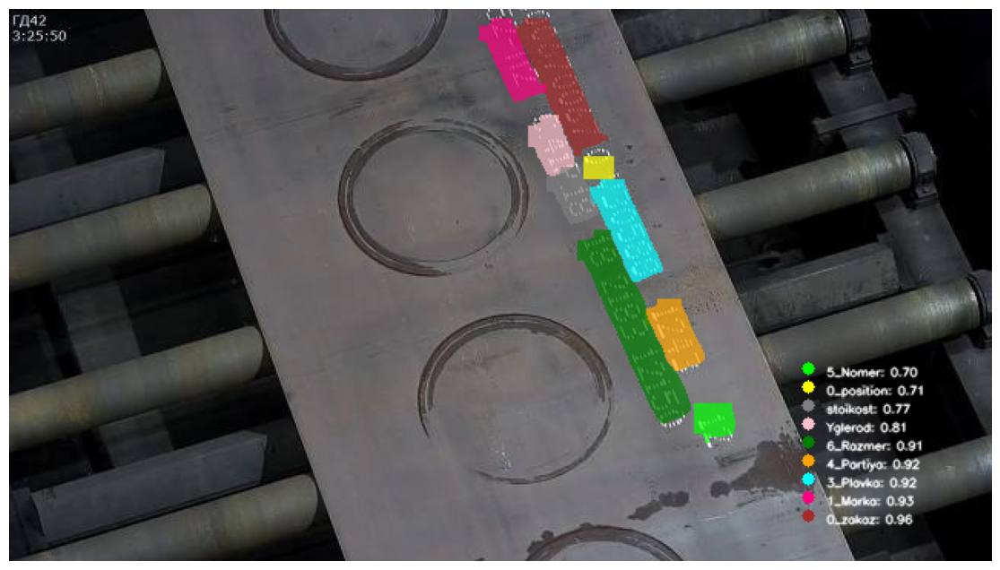

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-20237-2023-V30588-12_jpg.rf.9319ef99ce107177288210c6131df139.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':      [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

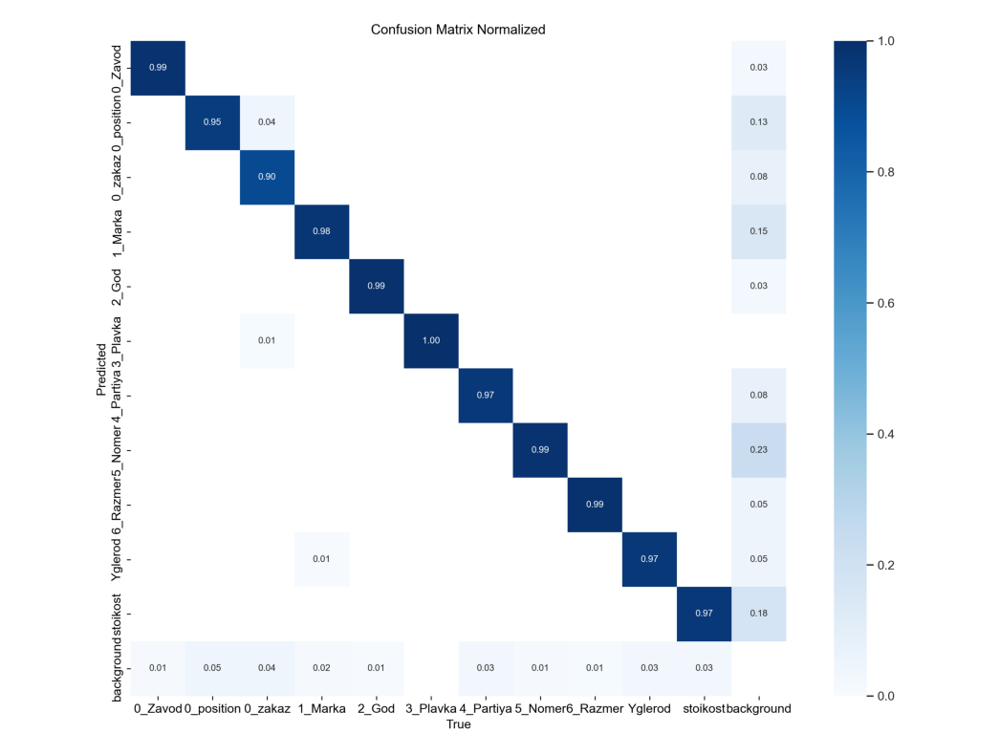

In [11]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from PIL import Image

# Указываем путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8n-seg\confusion_matrix_normalized.png"

# Загружаем изображение
img = Image.open(img_path)

# Показываем изображение с увеличенным размером
plt.figure(figsize=(20, 10))  # Увеличим размер графика
plt.imshow(img)
plt.axis('off')  # Отключаем оси
plt.show()  # Один раз что измеить в коде


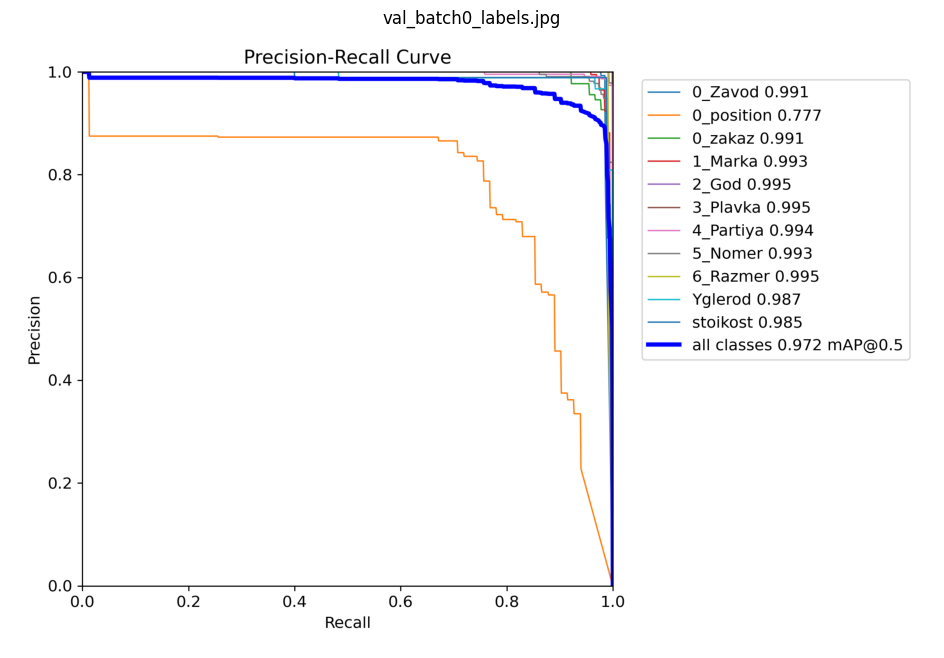

In [12]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val_yolov8n-seg'

# Путь к изображению
image_path = os.path.join(val_images_path, 'MaskPR_curve.png')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

In [18]:
import pandas as pd

# Данные по сегментации (Mask)
data = [
    ['all', '226/1716', 0.972, 0.951, 0.972, 0.735],
    ['0_Zavod', '136/136', 0.992, 0.985, 0.991, 0.815],
    ['0_position', '82/82', 0.786, 0.76, 0.777, 0.281],
    ['0_zakaz', '89/89', 1, 0.918, 0.991, 0.743],
    ['1_Marka', '194/194', 0.99, 0.973, 0.993, 0.807],
    ['2_God', '136/136', 0.99, 0.993, 0.995, 0.811],
    ['3_Plavka', '226/226',  0.996, 1, 0.995, 0.844],
    ['4_Partiya', '223/223', 0.991, 0.97, 0.994, 0.765],
    ['5_Nomer', '223/223', 0.982, 0.957, 0.993, 0.77],
    ['6_Razmer', '226/228', 0.991, 0.991, 0.995, 0.824],
    ['Yglerod', '89/89',  0.988, 0.921, 0.987, 0.702],
    ['stoikost', '90/90', 0.986, 0.989, 0.985, 0.72]
]

# Названия колонок
columns = ['Class',   'Images/Instances', 'Precision', 'Recall', 'mAP50', 'mAP50-95']

# Создание DataFrame
df_test_yolov8n = pd.DataFrame(data, columns=columns)

# Вычисление F1-меры
df_test_yolov8n["F1-Score"] = 2 * (df_test_yolov8n["Precision"] * df_test_yolov8n["Recall"]) / (df_test_yolov8n["Precision"] + df_test_yolov8n["Recall"])

# Сохранение в CSV
df_test_yolov8n.to_csv('segmentation_metrics_test.csv', index=False)

# Просмотр
#print(df_test)

df_test_yolov8n.style.set_caption("Таблица метрик сегментации по классам")

,Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
0,all,226/1716,0.972000,0.951000,0.972000,0.735000,0.961385
1,0_Zavod,136/136,0.992000,0.985000,0.991000,0.815000,0.988488
2,0_position,82/82,0.786000,0.760000,0.777000,0.281000,0.772781
3,0_zakaz,89/89,1.000000,0.918000,0.991000,0.743000,0.957247
4,1_Marka,194/194,0.990000,0.973000,0.993000,0.807000,0.981426
5,2_God,136/136,0.990000,0.993000,0.995000,0.811000,0.991498
6,3_Plavka,226/226,0.996000,1.000000,0.995000,0.844000,0.997996
7,4_Partiya,223/223,0.991000,0.970000,0.994000,0.765000,0.980388
8,5_Nomer,223/223,0.982000,0.957000,0.993000,0.770000,0.969339
9,6_Razmer,226/228,0.991000,0.991000,0.995000,0.824000,0.991000


In [19]:
# Фильтруем строку с классом 'all'
row_all = df_test_yolov8n[df_test_yolov8n["Class"] == "all"].reset_index(drop=True)

# Скрываем индекс при выводе
row_all.style.set_caption("Средние значения метрик по всем классам").hide(axis="index")



Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
all,226/1716,0.972000,0.951000,0.972000,0.735000,0.961385


### Yolov8s-seg

In [122]:
model = YOLO('yolov8s-seg.pt')

100%|█████████████████████████████████████████████████████████████████████████████| 22.8M/22.8M [00:00<00:00, 30.5MB/s]


 Проверка доступности GPU:

GPU (графический процессор) часто используется для ускорения обучения нейронных сетей, так как он может параллельно обрабатывать множество вычислений. 
Это делает его гораздо более эффективным для обучения больших моделей по сравнению с обычным CPU (центральным процессором).

Если GPU доступен, мы выводим информацию о названии устройства, иначе используется CPU для выполнения модели.

In [10]:
# Проверка доступности GPU
if torch.cuda.is_available():
    print(f"GPU доступен: {torch.cuda.get_device_name(0)}")
else:
    print("GPU не найден — используется CPU")

GPU доступен: NVIDIA GeForce GTX 1060 3GB


**`epochs=50`**  
Количество эпох — это количество полных проходов через весь обучающий набор данных. Было выбрано **50 эпох**, чтобы обеспечить достаточно времени для обучения модели, при этом не перегружая процесс.

**`data=base_yolo / "data.yaml"`**  
Указывает путь к файлу `data.yaml`, который содержит настройки для обучения модели: путь к изображениям, количество классов и их названия. Этот файл необходим для правильной настройки данных, которые будут использованы для обучения и валидации модели.

**`imgsz=640`**  
Размер изображений для модели. Все изображения будут масштабированы до 640x640 пикселей. Чем больше размер, тем лучше качество, но и выше нагрузка на GPU. **640** — это хорошее компромиссное значение, которое обеспечивает баланс между качеством и скоростью обучения, не перегружая оборудование.

**`batch=2`**  
Размер батча — это количество изображений, которые будут обработаны за один шаг (батч) во время тренировки.
Выбрано **batch=2**, так как это оптимальный размер для GPU с **3GB VRAM**. Размер батча напрямую влияет на использование видеопамяти: чем больше батч, тем больше памяти требуется.

**`device=0`**  
Этот параметр указывает, на каком устройстве будет происходить обучение. Если **GPU**, ставим `device=0`


Запуск обучения

In [124]:
# Запуск обучения
results = model.train(
    data=base_yolo / "data.yaml",  # Путь к data.yaml
    epochs=50,                      # Количество эпох 
    imgsz=640,                     # Размер изображений (640 для более точной работы)
    batch=2,                       # Размер батча 
    device=0                       # Устройство (0 — если есть GPU)
)

New https://pypi.org/project/ultralytics/8.3.107 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.31  Python-3.12.3 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
engine\trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\data.yaml, epochs=50, time=None, patience=100, batch=2, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=

100%|█████████████████████████████████████████████████████████████████████████████| 6.25M/6.25M [00:00<00:00, 14.1MB/s]


AMP: checks passed 


train: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\train\labels.cache... 3222 images, 10 backgrou
val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\validation\labels.cache... 228 images, 0 backgro


Plotting labels to runs\segment\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs\segment\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.41G      1.306      1.921      1.775      1.156         31        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.864      0.869      0.914      0.664       0.88      0.871       0.93      0.622

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.45G     0.9915      1.409     0.8841     0.9899         40        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.878      0.924       0.95      0.715      0.874       0.92      0.942      0.656



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.48G     0.9419      1.303      0.778     0.9723         23        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.954       0.93       0.96      0.718      0.962      0.937      0.975      0.666



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.48G     0.9163      1.274     0.6947     0.9634         12        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.955      0.956      0.977       0.76      0.948      0.951      0.974      0.687



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.51G     0.8712      1.199      0.636     0.9465         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.964      0.953      0.976      0.745      0.967      0.955       0.98      0.688



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.52G     0.8471      1.161     0.5976     0.9392         30        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.975      0.959      0.982      0.758      0.976      0.959      0.982      0.691



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.46G      0.837      1.159     0.5905     0.9374         41        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.971      0.959      0.982      0.766      0.957      0.946      0.967      0.687



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.51G     0.8204      1.129     0.5609     0.9296         45        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.946      0.963      0.976      0.769      0.943       0.96      0.973      0.701



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.41G     0.7991       1.09     0.5291     0.9232         29        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.961      0.954      0.977      0.773      0.961      0.954      0.979      0.693



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.45G     0.7947      1.096     0.5235     0.9239         50        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.969      0.985      0.777      0.971      0.967      0.981      0.707



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.41G     0.7764      1.064      0.506     0.9187         40        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.968      0.972      0.985      0.792      0.965      0.959      0.977      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.59G     0.7639      1.046     0.4924     0.9125         10        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.972      0.971      0.984      0.784      0.968      0.958      0.978      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.48G     0.7617       1.04      0.486     0.9111         37        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.977      0.971      0.985      0.779      0.976      0.968      0.981      0.713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.42G     0.7533      1.025     0.4779     0.9094         43        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.972      0.987        0.8      0.971      0.966      0.981      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.44G     0.7522      1.035     0.4815     0.9137         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.977      0.965      0.984      0.797      0.977      0.964      0.983      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.42G     0.7321      1.006     0.4589     0.9035         44        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.974       0.97      0.987      0.807      0.974      0.964      0.983       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.41G     0.7211     0.9933     0.4489     0.9007         36        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.968      0.985      0.804      0.974      0.962      0.981      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.56G     0.7214     0.9932      0.444     0.8994         12        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.977      0.987      0.806      0.974      0.966      0.984      0.731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.43G     0.7179     0.9832     0.4396     0.9001         39        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.977      0.976      0.988      0.811      0.967      0.967      0.978      0.731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50       1.4G     0.7161     0.9827     0.4384     0.8984         29        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.978      0.984      0.988      0.812      0.972      0.963      0.979      0.729



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.48G      0.707     0.9653     0.4281     0.8959         43        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.975      0.988      0.811      0.977      0.969      0.983      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.41G     0.6887     0.9535     0.4196     0.8899         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.978       0.98      0.988      0.812      0.964      0.969      0.979      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.42G     0.6948     0.9579     0.4216     0.8949         37        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.973      0.985        0.8      0.974      0.965       0.98      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.44G     0.6916     0.9434     0.4141     0.8923         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.977      0.986      0.813      0.973       0.97      0.981      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.42G     0.6919     0.9527     0.4132      0.893         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.974      0.986      0.813      0.967      0.965      0.981      0.733



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.41G     0.6811     0.9368      0.407     0.8889         27        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.981      0.975      0.986      0.813      0.975      0.968      0.982      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.49G     0.6724     0.9196     0.4031     0.8855         29        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.974      0.985      0.813      0.967      0.968      0.979      0.731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.44G     0.6689     0.9174     0.3998     0.8842         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.981      0.972      0.987      0.811      0.972      0.965      0.974      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.43G     0.6616     0.9108     0.3998     0.8816         33        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.978      0.987       0.82      0.974      0.972      0.984       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.44G     0.6616     0.9115     0.3909     0.8833         21        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.977      0.988      0.822      0.971      0.966      0.978      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.48G     0.6648     0.9164     0.3953     0.8848         24        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.973      0.971      0.981      0.821      0.971      0.966       0.98      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.63G     0.6509      0.887      0.382     0.8784         16        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983       0.98      0.989      0.825      0.974      0.969      0.984       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.41G     0.6421     0.8822     0.4632     0.8741         24        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.974      0.986      0.822       0.98      0.971      0.986      0.738



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.47G     0.6475     0.8926     0.3779     0.8777         28        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.981      0.989      0.828      0.983      0.972      0.985      0.743



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.41G     0.6372     0.8767     0.3741     0.8747         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.986      0.972      0.985      0.825      0.976      0.962      0.978      0.741



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.44G     0.6347     0.8722     0.3685     0.8742         47        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.985      0.983      0.988      0.828      0.974      0.973      0.981      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.43G     0.6376     0.8778     0.3682      0.875         51        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.988      0.975      0.988      0.826      0.978      0.965       0.98       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.42G     0.6284     0.8639     0.3679     0.8726         39        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.984      0.975      0.987      0.829      0.977      0.975      0.983      0.748



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.46G     0.6312      0.871     0.3676     0.8729         38        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735       0.98      0.979      0.989      0.829      0.971      0.969      0.979      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.44G     0.6204     0.8582     0.3574      0.871         40        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.976      0.976      0.985       0.83      0.976       0.97      0.981      0.748


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.33G     0.5794     0.8008     0.3228     0.8537         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.979      0.972      0.982      0.827       0.97       0.97      0.982      0.742



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.41G     0.5753     0.7907     0.3221     0.8488          9        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.976      0.984      0.828      0.974      0.972      0.982      0.749



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.39G     0.5678      0.787     0.3157     0.8518         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.979      0.984       0.83      0.968      0.969      0.976      0.743



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.28G     0.5622     0.7797     0.3107     0.8495         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.978      0.976      0.984       0.83      0.971      0.968       0.98      0.741



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.36G     0.5522     0.7692     0.3093     0.8461         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.982      0.979      0.987       0.83      0.971      0.969       0.98       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50       1.4G     0.5483     0.7719     0.3046     0.8452         18        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.984      0.978      0.987      0.835      0.974      0.969      0.979      0.744



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.42G     0.5442     0.7559     0.3014     0.8433         14        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.983      0.977      0.985      0.833      0.972      0.967      0.977      0.745



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50       1.4G     0.5397     0.7498     0.2996     0.8427         15        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.984      0.978      0.987      0.833      0.973      0.965      0.977      0.745



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.42G     0.5328     0.7468     0.2972     0.8394         12        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.984      0.978      0.987      0.834      0.974      0.969       0.98      0.745



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.41G     0.5314     0.7437     0.2942     0.8404         16        640: 100%|██████████| 1611/1611 [0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all        228       1735      0.985      0.978      0.988      0.838      0.973      0.968      0.979      0.746



50 epochs completed in 4.725 hours.
Optimizer stripped from runs\segment\train\weights\last.pt, 23.8MB
Optimizer stripped from runs\segment\train\weights\best.pt, 23.8MB

Validating runs\segment\train\weights\best.pt...
Ultralytics YOLOv8.2.31  Python-3.12.3 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8s-seg summary (fused): 195 layers, 11783857 parameters, 0 gradients, 42.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        228       1735      0.985      0.978      0.988      0.838      0.973      0.968      0.979      0.746
               0_Zavod        137        137      0.993      0.988      0.994        0.9          1      0.996      0.995      0.805
            0_position         89         89      0.988      0.962      0.991      0.581      0.862      0.843       0.86      0.325
               0_zakaz         86         86      0.972      0.953      0.978      0.866      0.946       0.93      0.982      0.774
               1_Marka        194        194      0.978      0.985      0.994      0.917      0.969      0.977       0.99      0.815
                 2_God        137        137      0.999          1      0.995       0.86      0.999          1      0.995      0.813
              3_Plavka        228        229      0.991      0.991      0.995      0.923       0.99      0.991      0.995      0.839
             4_Partiya        228        228      0.985      0.961   

**Гистограмма распределения классов**

На данном графике отображается гистограмма распределения классов в тренировочном наборе данных. Каждый столбец представляет собой количество экземпляров для конкретного класса, где:

- **Ось X**: Названия классов
- **Ось Y**: Количество экземпляров для каждого класса.

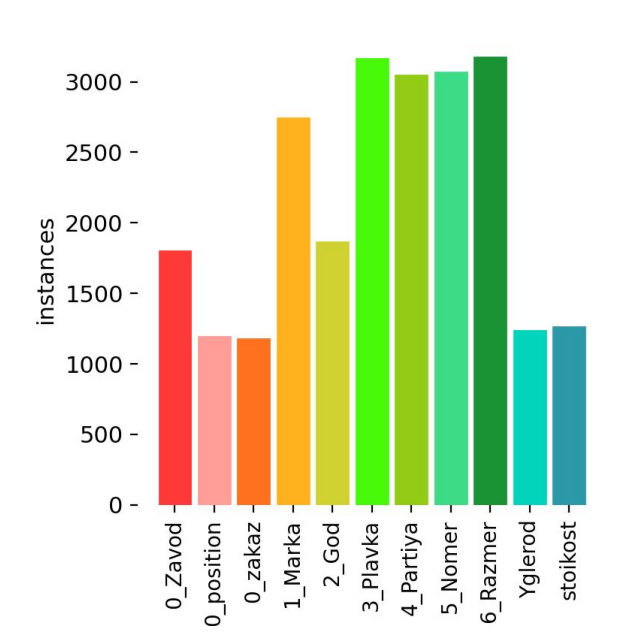

In [14]:
from PIL import Image
import matplotlib.pyplot as plt

# Указываем путь к изображению
img_path = r'D:\Segmentation_Project\Notebooks\runs\segment\train\labels.jpg' 
img = Image.open(img_path)

# Обрезаем изображение, оставляя только гистограмму (левую и верхнюю часть)
left = 0
top = 0
right = img.width // 2  # Оставляем только левую часть
bottom = img.height // 1.95 # Оставляем только верхнюю половину

# Создаем обрезанное изображение
cropped_img = img.crop((left, top, right, bottom))

# Увеличиваем изображение для лучшей видимости
fig, ax = plt.subplots(figsize=(14, 8))  # Увеличиваем размер графика
ax.imshow(cropped_img)
ax.axis('off')  # Отключаем оси
plt.show()

**Рассмотрим, как изменялись ключевые метрики качества модели на протяжении эпох валидации и обучения.**  

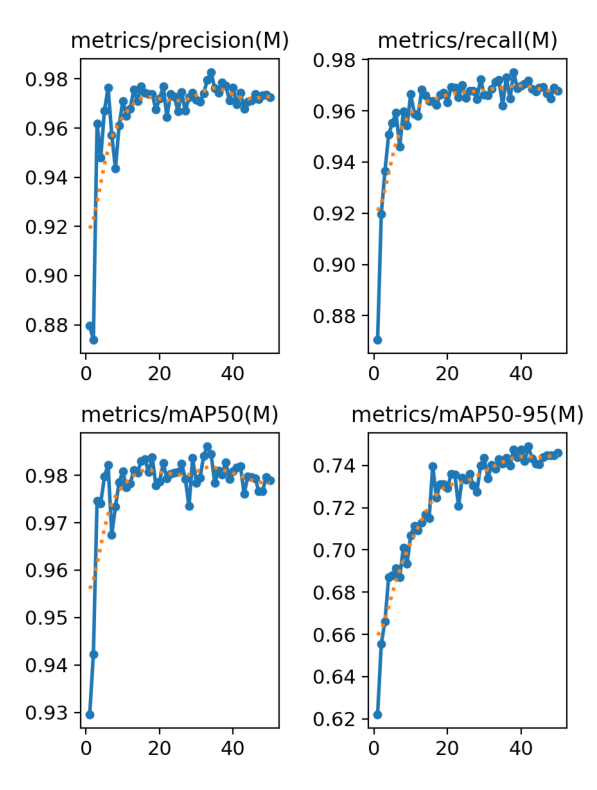

In [11]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры
width, height = img.size

# Вычисляем координаты обрезки (правые 4 графика = последние 4 / 8 графиков в строке)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# Координаты: 6-й и 7-й графики (сверху) и 6-й и 7-й (снизу)
# Верхний ряд (ряд 0), ячейки 6 и 7
top_left_1 = (cell_width * 6, 0, cell_width * 8, cell_height)

# Нижний ряд (ряд 1), ячейки 6 и 7
top_left_2 = (cell_width * 6, cell_height, cell_width * 8, height)

# Обрезаем и объединяем изображения
upper = img.crop(top_left_1)
lower = img.crop(top_left_2)

# Создаём новое изображение (высота = сумме двух блоков)
combined = Image.new('RGB', (upper.width, upper.height + lower.height))
combined.paste(upper, (0, 0))
combined.paste(lower, (0, upper.height))

# Отображаем
plt.figure(figsize=(20, 10))
plt.imshow(combined)
plt.axis('off')
plt.show()

**Оценим, как изменялись значения функции потерь (loss) по эпохам обучения и валидации.**  
**Особое внимание уделим `seg_loss` и `cls_loss`, поскольку они отражают два важных аспекта работы модели сегментации:**

- **`seg_loss`** — это ошибка сегментации, которая показывает, насколько точно модель выделяет форму объектов на изображении;  
- **`cls_loss`** — это ошибка классификации, отражающая точность определения классов найденных объектов.



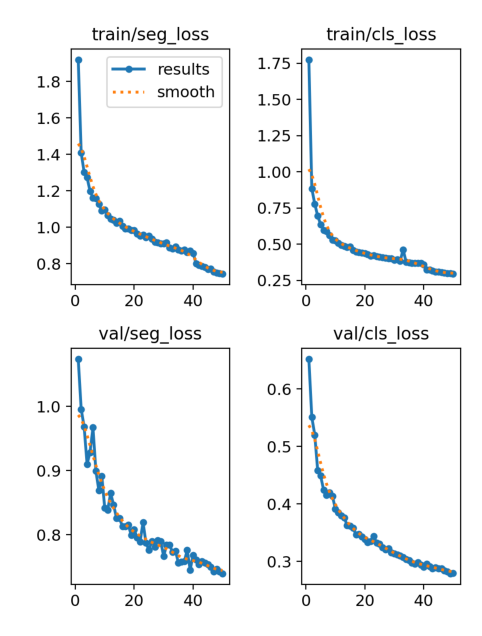

In [10]:
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\train\results.png"  

# Загружаем изображение
img = Image.open(img_path)

# Получаем размеры изображения
width, height = img.size

# Настройка сетки (YOLO рисует 8 графиков в строку, 2 строки)
cols = 8
rows = 2
cell_width = width // cols
cell_height = height // rows

# --- Вырезаем графики №2 и №3 по порядку (индексы 1 и 2) ---

# Верхний ряд (ряд 0), ячейки 1 и 2
top_crop = (cell_width * 1, 0, cell_width * 3, cell_height)

# Нижний ряд (ряд 1), ячейки 1 и 2
bottom_crop = (cell_width * 1, cell_height, cell_width * 3, height)

# Обрезаем
top_img = img.crop(top_crop)
bottom_img = img.crop(bottom_crop)

# Объединяем два графика вертикально
combined = Image.new('RGB', (top_img.width, top_img.height + bottom_img.height))
combined.paste(top_img, (0, 0))
combined.paste(bottom_img, (0, top_img.height))

# Отображаем
plt.figure(figsize=(12, 8))
plt.imshow(combined)
plt.axis('off')
plt.show()


**На основании результатов можно сделать вывод, что модель достигла плато обучения.**  
Основные метрики (`mAP50`, `mAP50-95`, `precision`, `recall`) стабилизировались и не демонстрируют существенного роста.

**Анализ графиков изменения функции потерь показывает, что значения `seg_loss` и `cls_loss` также стабилизировались к последним эпохам обучения как на обучающей, так и на валидационной выборках.**  
Отсутствие расхождения между `train_loss` и `val_loss` свидетельствует о том, что модель не переобучилась и сохраняет обобщающую способность.

С учётом динамики метрик и функции потерь, дальнейшее обучение модели **нецелесообразно** из-за отсутствия прироста качества и повышающегося риска переобучения.


По завершении процесса обучения YOLOv8 автоматически сохраняет веса модели, показавшей наилучшие результаты на валидационной выборке в ходе тренировки.

Файл `best.pt` сохраняется в директории текущей обучающей сессии: `D:\Segmentation_Project\Notebooks\runs\segment\train\weights\best.pt`



Загружаем файл `best.pt` и запускаем тестирование, чтобы отдельно просмотреть итоговые метрики качества по классам:

In [20]:
from ultralytics import YOLO

# Загрузка обученной модели сегментации (YOLOv8) с весами
model_path = "runs/segment/train/weights/best.pt"
model = YOLO(model_path)
print("Модель загружена. Классы:", model.names)

Модель загружена. Классы: {0: '0_Zavod', 1: '0_position', 2: '0_zakaz', 3: '1_Marka', 4: '2_God', 5: '3_Plavka', 6: '4_Partiya', 7: '5_Nomer', 8: '6_Razmer', 9: 'Yglerod', 10: 'stoikost'}


**Добавляем в data.yaml путь для test**

In [20]:
from pathlib import Path
import yaml

# Базовая директория проекта
base_yolo = Path(r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8")

# Пути к test/images и labels (если пригодится позже)
test_images = base_yolo / "test" / "images"
test_labels = base_yolo / "test" / "labels"

# Путь к data.yaml
yaml_path = base_yolo / "data.yaml"

# Загружаем YAML-файл
with open(yaml_path, 'r', encoding='utf-8') as f:
    data = yaml.safe_load(f)

# Добавляем путь к test, если его ещё нет
if 'test' not in data:
    # Относительный путь от data.yaml к test/images
    test_path = test_images.relative_to(base_yolo).as_posix()
    data['test'] = test_path

# Сохраняем изменения
with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data, f, allow_unicode=True)

print(f"✅ Добавлено test: {data['test']} в data.yaml")

✅ Добавлено test: test/images в data.yaml


**Запускаем тестирование модели**


In [22]:
from ultralytics import YOLO

# Загрузка модели
model = YOLO('runs/segment/train/weights/best.pt')  # путь к .pt

# Запуск тестирования
metrics = model.val(
    data=base_yolo / "data.yaml",   # путь к конфигу
    split='test',       # тестовый набор
    plots=True,         # сохранить графики
    device=0            # можно указать GPU (или 'cpu')
)

Ultralytics YOLOv8.2.31  Python-3.12.3 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 3GB, 3072MiB)
YOLOv8s-seg summary (fused): 195 layers, 11783857 parameters, 0 gradients, 42.5 GFLOPs


val: Scanning D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\labels.cache... 226 images, 0 backgrounds, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all        226       1716      0.975      0.978      0.982      0.848      0.974      0.966      0.981      0.757
               0_Zavod        136        136      0.989      0.993      0.995      0.912      0.991      0.993      0.995       0.85
            0_position         82         82      0.868      0.902      0.898      0.586      0.845      0.829      0.872      0.323
               0_zakaz         89         89      0.998      0.966      0.993      0.856      0.976      0.933      0.979       0.77
               1_Marka        194        194      0.997       0.99      0.994      0.915      0.995      0.981      0.994      0.828
                 2_God        136        136      0.982      0.985      0.994      0.882      0.992      0.993      0.995      0.815
              3_Plavka        226        226      0.998          1      0.995      0.938      0.998          1      0.995      0.863
             4_Partiya        223        223      0.982      0.977   

**Посмотрим результат на отдельных листах**


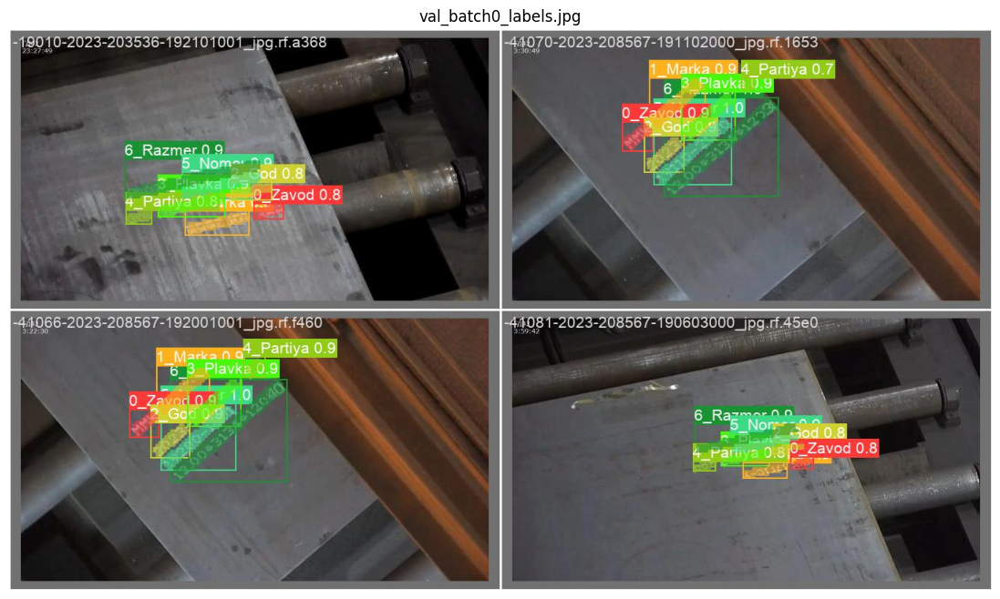

In [18]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val'

# Путь к изображению
image_path = os.path.join(val_images_path, 'val_batch0_pred.jpg')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

**Поскольку визуализация ограничивающих рамок (bounding boxes) затрудняет понимание результата сегментации, отказываемся от их отображения.**   

**🎨 Назначаем фиксированные цвета классам и визуализируем предсказания**

На этом этапе каждому классу вручную присваивается уникальный цвет для маски, чтобы визуально различать сегментированные объекты на изображении.
Затем для каждого предсказанного объекта выполняется наложение полупрозрачной цветной маски,  добавляется подпись с названием класса и вероятностью распознавания.
Это позволяет наглядно оценить качество сегментации без использования ограничивающих рамок (bounding boxes), что особенно удобно при плотной разметке.

**Протестируем лист «ММК»**  

tensor([8.], device='cuda:0') tensor([0.9515], device='cuda:0') tensor([[253.8809, 218.2569, 465.1906, 360.0000]], device='cuda:0')
tensor([3.], device='cuda:0') tensor([0.9348], device='cuda:0') tensor([[247.3751, 173.3363, 348.5405, 253.2197]], device='cuda:0')
tensor([5.], device='cuda:0') tensor([0.9224], device='cuda:0') tensor([[296.1686, 198.0588, 401.5735, 279.6263]], device='cuda:0')
tensor([0.], device='cuda:0') tensor([0.9108], device='cuda:0') tensor([[197.9895, 241.4247, 250.7546, 284.5054]], device='cuda:0')
tensor([7.], device='cuda:0') tensor([0.9094], device='cuda:0') tensor([[240.7031, 241.2523, 382.8655, 349.3516]], device='cuda:0')
tensor([6.], device='cuda:0') tensor([0.8975], device='cuda:0') tensor([[399.8879, 168.2346, 446.0208, 209.1603]], device='cuda:0')
tensor([4.], device='cuda:0') tensor([0.8335], device='cuda:0') tensor([[230.8041, 270.1030, 296.5614, 324.2404]], device='cuda:0')


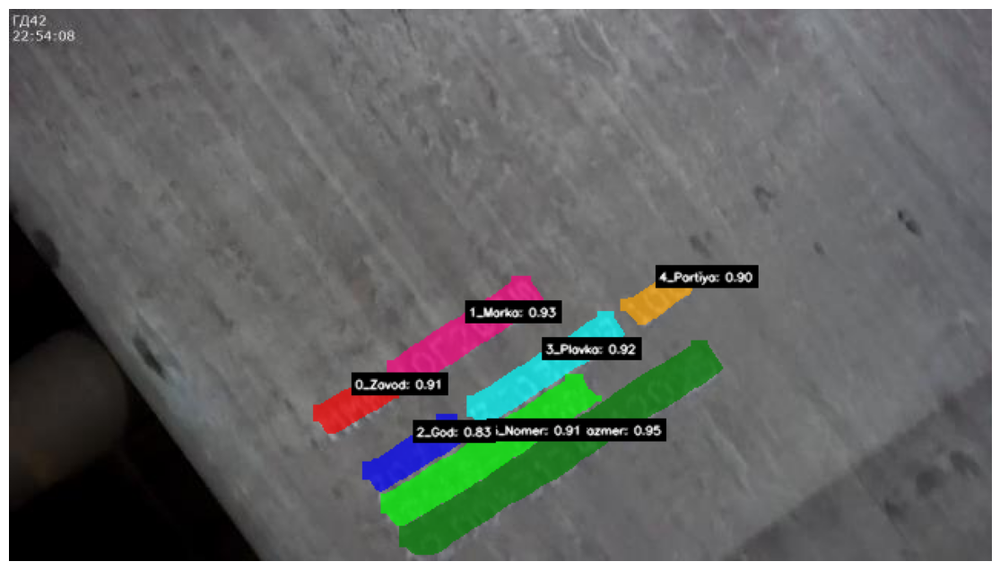

In [22]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'

# Загружаем изображение
image = cv2.imread(image_path)

# Прогоняем через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()


# 🎨 Задаем фиксированные цвета для классов (формат BGR)
colors = {
    '0_Zavod':     [0, 0, 255],      # Красный
    '0_position':  [0, 255, 255],    # Жёлтый
    '0_zakaz':     [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],    # Фиолетовый
    '2_God':       [255, 0, 0],      # Синий
    '3_Plavka':    [255, 255, 0],    # Голубой
    '4_Partiya':   [0, 165, 255],    # Оранжевый
    '5_Nomer':     [0, 255, 0],      # Зелёный
    '6_Razmer':    [0, 128, 0],      # Тёмно-зелёный
    'Yglerod':     [203, 192, 255],  # Розовый
    'stoikost':    [128, 128, 128],  # Серый
}

# Проверка количества объектов
#print(f"Количество предсказанных объектов: {len(res.boxes)}")

text_offset = {}

for box in res.boxes:
    print(box.cls, box.conf, box.xyxy)


# Отрисовка масок, названий классов и вероятностей
for box, mask in zip(res.boxes, res.masks.data):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])  # fallback — чёрный
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7  # наложение цвета

    # Центр маски
    M = cv2.moments(mask_bool.astype(np.uint8))
    if M["m00"] > 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
    else:
        x1, y1, _, _ = map(int, box.xyxy[0].cpu().numpy())
        cX, cY = x1, y1  # fallback

    # Группировка по сетке 50x50 пикселей
    grid_x = cX // 50
    grid_y = cY // 50
    group_key = (grid_x, grid_y)

    # Смещение по Y для этой группы
    offset_y = text_offset.get(group_key, 0)
    text_offset[group_key] = offset_y + 1

    # Координаты текста выше маски
    label_y = max(cY - 10 - offset_y * 8, 1)

    

    # Текст
    text = f"{class_name}: {conf:.2f}"
    font_scale = 0.25
    thickness = 1
    (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

    # Фон под текст
    bg_x1 = cX
    bg_y1 = label_y - th - 4
    bg_x2 = cX + tw + 4
    bg_y2 = label_y + 4
    cv2.rectangle(mask_overlay, (bg_x1, bg_y1), (bg_x2, bg_y2), (0, 0, 0), -1)

    # Рисуем текст
    cv2.putText(
        mask_overlay, text, (cX + 2, label_y),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=thickness, lineType=cv2.LINE_AA
    )

# Преобразуем изображение из BGR → RGB для корректного отображения
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))  # Размер окна (ширина x высота в дюймах)
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()


Но при большом количестве объектов подписи начинают перекрывать друг друга и мешают восприятию, внесем легенду в **правый нижний угол.**  
**В ней классы отсортированы по возрастанию вероятности распознавания**, что позволяет быстро оценить степень уверенности модели для каждого объекта.



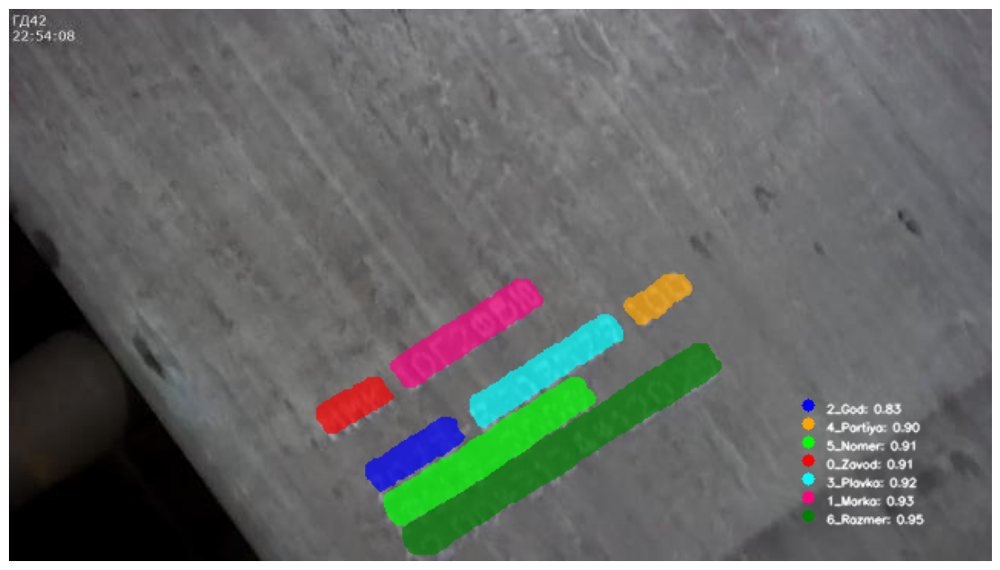

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-18998-2023-303529-191602000_jpg.rf.fad21a5e43a621dfb5f6db329594ba35.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':     [42, 42, 165],    
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

**Протестируем лист «Уральская Сталь»**

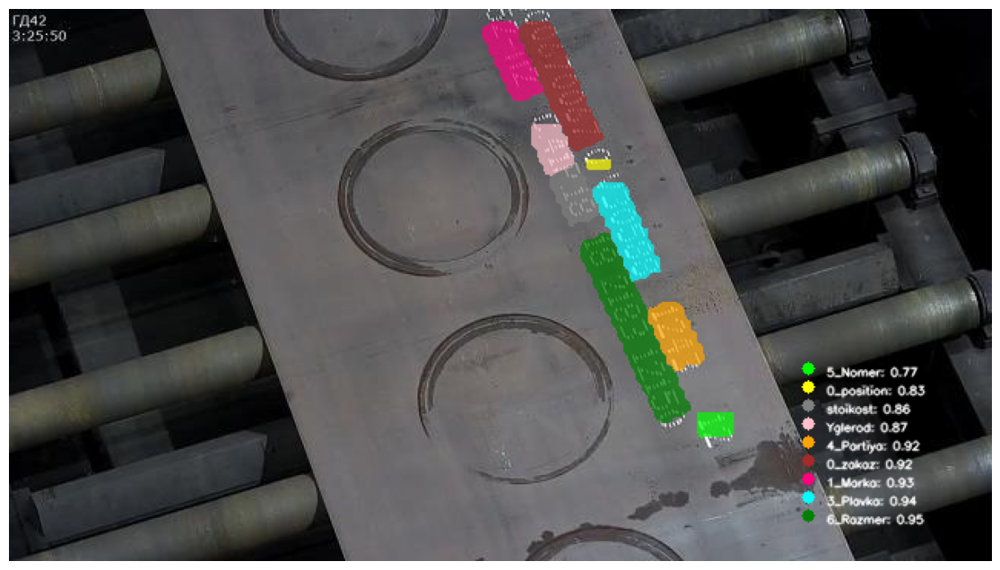

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = r'D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images\-20237-2023-V30588-12_jpg.rf.9319ef99ce107177288210c6131df139.jpg'
image = cv2.imread(image_path)

# Прогон через модель
results = model.predict(source=image, conf=0.25, iou=0.6, verbose=False)
res = results[0]
orig_image = res.orig_img
mask_overlay = orig_image.copy()

# 🎨 Фиксированные цвета
colors = {
    '0_Zavod':     [0, 0, 255],
    '0_position':  [0, 255, 255],
    '0_zakaz':      [42, 42, 165],     # Тёплый Коричневый
    '1_Marka':     [128, 0, 255],
    '2_God':       [255, 0, 0],
    '3_Plavka':    [255, 255, 0],
    '4_Partiya':   [0, 165, 255],
    '5_Nomer':     [0, 255, 0],
    '6_Razmer':    [0, 128, 0],
    'Yglerod':     [203, 192, 255],
    'stoikost':    [128, 128, 128],
}

# Для сбора легенды в порядке детекции
legend_entries = []

# Отрисовка масок + сбор легенды
for idx, (box, mask) in enumerate(zip(res.boxes, res.masks.data)):
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    class_name = model.names[cls_id]

    # Маска → бинарная
    mask_bool = cv2.resize(mask.cpu().numpy(), (orig_image.shape[1], orig_image.shape[0])) > 0.5

    # Цвет маски
    color = colors.get(class_name, [0, 0, 0])
    mask_overlay[mask_bool] = mask_overlay[mask_bool] * 0.3 + np.array(color) * 0.7

    # Добавляем в легенду (с индексом для сохранения порядка)
    legend_entries.append((idx, class_name, conf, color))

# 📌 Рисуем легенду в правом нижнем углу
start_x = orig_image.shape[1] - 120  # сдвинуть правее (ближе к правому краю)
start_y = orig_image.shape[0] - 30   # ближе к нижнему краю
circle_radius = 4
line_height = 12

for i, (idx, name, conf, color) in enumerate(legend_entries):
    y = start_y - i * line_height
    x = start_x

    # Кружок
    cv2.circle(mask_overlay, (x, y), circle_radius, color, -1)

    # Текст
    text = f"{name}: {conf:.2f}"
    cv2.putText(
        mask_overlay, text, (x + 12, y + 5),
        cv2.FONT_HERSHEY_SIMPLEX, font_scale,
        (255, 255, 255), thickness=1, lineType=cv2.LINE_AA
    )

# Отображение
mask_overlay_rgb = cv2.cvtColor(mask_overlay.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(mask_overlay_rgb)
plt.axis('off')
plt.show()

**Для оценки итоговой производительности модели проводится анализ метрик сегментации на тестовой выборке.**


**Нормированная матрица ошибок** (confusion_matrix_normalized.png): Эта визуализация представляет собой нормализованную версию матрицы ошибок. Она представляет данные в виде пропорций, а не сырых подсчетов. Такой формат упрощает сравнение производительности между классами.

**Ось X (горизонтальная): True labels** — это истинные метки классов, то есть фактическая категория объектов, как они были размечены в данных.

**Ось Y (вертикальная): Predicted labels** — это предсказанные метки классов, то есть то, что модель предсказала для объектов.

Каждый элемент в таблице показывает долю объектов, которые были правильно или неправильно классифицированы для каждого класса.

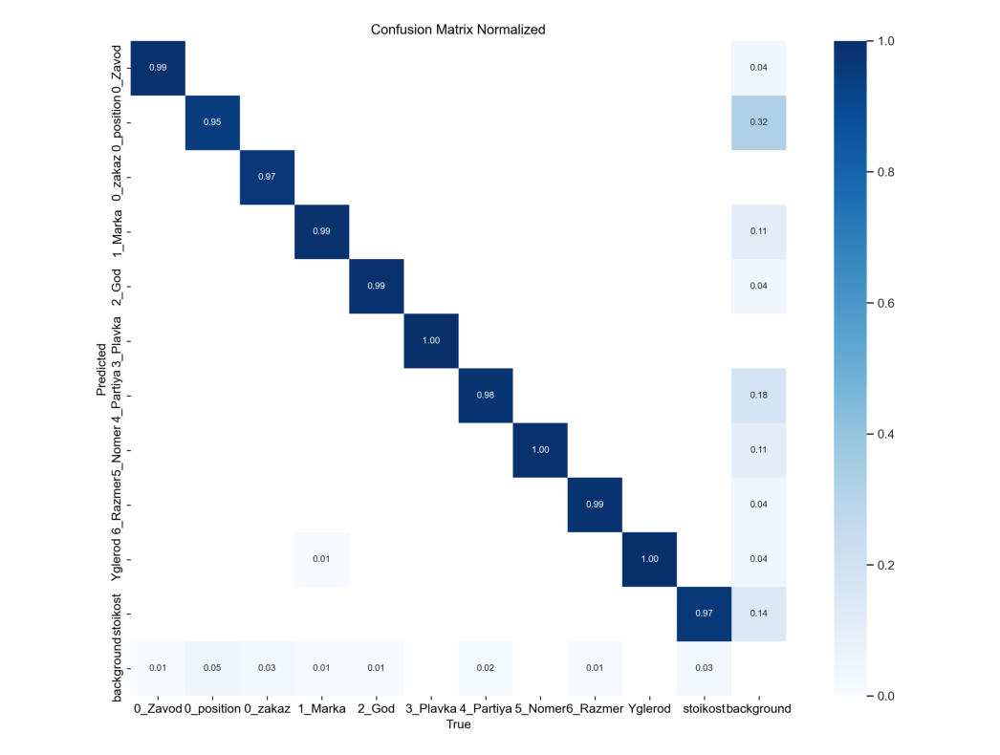

In [27]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from PIL import Image

# Указываем путь к изображению
img_path = r"D:\Segmentation_Project\Notebooks\runs\segment\val\confusion_matrix_normalized.png"

# Загружаем изображение
img = Image.open(img_path)

# Показываем изображение с увеличенным размером
plt.figure(figsize=(20, 10))  # Увеличим размер графика
plt.imshow(img)
plt.axis('off')  # Отключаем оси
plt.show()  # Один раз что измеить в коде


**Значения на диагонали** — это **True Positives (TP)**, то есть количество объектов, которые были правильно классифицированы как принадлежащие соответствующему классу.

Все остальные значения в матрице (которые не находятся на диагонали) представляют собой ошибки классификации (**False Positives** и **False Negatives**):

Например, для класса **2_God**:

- **TP = 0.99**: Значение на пересечении строки  **2_God** и столбца  **2_God** на диагонали, которое отвечает за **True Positives**.

- Пересечение  **2_God** по оси **True** с **background**, равное **0.01**, соответствует числу **False Negatives** (**FN**), — это случаи, когда настоящие объекты класса **2_God** были ошибочно классифицированы как фон.
  
- Пересечение **background** с  **2_God** по оси **Predicted**, составляющее **0.04**, отвечает за **False Positives** (**FP**)- случаи, при которых модель неверно распознала фон как объект класса **2_God**

**Кривая точности и полноты (PR-curve)**

PR-кривая — это важная визуализация для классификационных задач, показывающая компромисс между **точностью (Precision)** и **полнотой (Recall)** при различных порогах. Она особенно полезна при работе с несбалансированными классами. Также **PR-кривая** является основой для вычисления метрики **AP (Average Precision)**, которая оценивает производительность модели, усредняя точность на разных уровнях полноты.

Отобразим **PR-кривую** для классов, где по **оси X — Recall**, по **оси Y — Precision**.


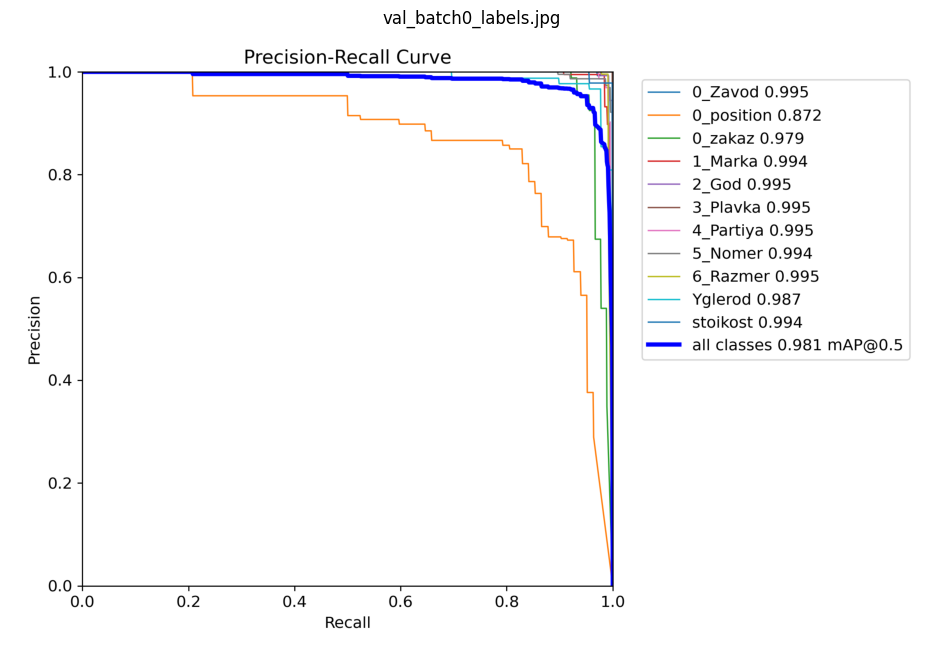

In [28]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Укажите путь к изображениям
val_images_path = r'D:\Segmentation_Project\Notebooks\runs\segment\val'

# Путь к изображению
image_path = os.path.join(val_images_path, 'MaskPR_curve.png')

# Загружаем изображение
img = Image.open(image_path)

# Отображаем изображение
plt.figure(figsize=(14, 8))
plt.imshow(img)
plt.title("val_batch0_labels.jpg")
plt.axis('off')  # Отключаем оси
plt.show()

Значения возле классов — это **mAP@0.5** для каждого класса. **mAP@0.5** (**mAP50**) — средняя точность при пороге **IoU**, равном **0.5**.


Значения `mAP@0.5` по большинству классов находятся на уровне **0.99**, что свидетельствует о высокой точности и полноте модели

Наименьшие значения наблюдаются у класса `0_position` (0.872), что может быть связано с меньшим количеством данных или визуальными особенностями этих объектов. 

В целом, модель демонстрирует стабильную и уверенную сегментацию по всем классам.

**Для дальнейшего исследования качества модели по каждому классу сформируем таблицу, содержащую значения ключевых метрик.** 

Создаем Таблицу с нашими классами и значениями метрик по ним, чтобы можно переименовать, добавлять колонки, сохранять данные на ПК. 

**После запуска тестирования модели формируется таблица с основными метриками для каждого класса.**  
Помимо стандартных показателей (`precision`, `recall`, `mAP50`), в таблицу также включается **`mAP50-95`** — усреднённое значение точности, рассчитанное при различных порогах IoU от 0.50 до 0.95 с шагом 0.05, что позволяет более строго оценить обобщающую способность модели.  

Также в таблице представлены две вспомогательные колонки:
- **`images`** — количество изображений в наборе проверки, содержащих класс объекта.
- **`instances`** — общее число экземпляров данного класса во всей тестовой выборке.

**Дополнительно в таблицу включаются вычисленные значения F1-меры**, отражающие баланс между точностью и полнотой для каждого класса.

Удаляем колонки для **Box**, т.к. для **Сегментации** нам нужны колонки **Mask**, Переименуем их в **Precision**, **Recall**, **mAP50** и **mAP50-95**

In [14]:
import pandas as pd

# Данные по сегментации (Mask)
data = [
    ['all', '226/1716', 0.974, 0.966, 0.981, 0.757],
    ['0_Zavod', '136/136', 0.991, 0.993, 0.995, 0.85],
    ['0_position', '82/82', 0.845, 0.829, 0.872, 0.323],
    ['0_zakaz', '89/89', 0.976, 0.933, 0.979, 0.77],
    ['1_Marka', '194/194', 0.995, 0.981, 0.994, 0.828],
    ['2_God', '136/136', 0.992, 0.993, 0.995, 0.815],
    ['3_Plavka', '226/226', 0.998, 1.0, 0.995, 0.8637],
    ['4_Partiya', '223/223', 0.996, 0.973, 0.995, 0.783],
    ['5_Nomer', '223/223', 0.985, 0.987, 0.994, 0.792],
    ['6_Razmer', '226/228', 0.996, 0.988, 0.995, 0.843],
    ['Yglerod', '89/89', 0.966, 0.978, 0.987, 0.726],
    ['stoikost', '90/90', 0.978, 0.974, 0.994, 0.73]
]

# Названия колонок
columns = ['Class',   'Images/Instances', 'Precision', 'Recall', 'mAP50', 'mAP50-95']

# Создание DataFrame
df_test = pd.DataFrame(data, columns=columns)

# Вычисление F1-меры
df_test["F1-Score"] = 2 * (df_test["Precision"] * df_test["Recall"]) / (df_test["Precision"] + df_test["Recall"])

# Сохранение в CSV
df_test.to_csv('segmentation_metrics_test.csv', index=False)

# Просмотр
#print(df_test)

df_test.style.set_caption("Таблица метрик сегментации по классам")

,Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
0,all,226/1716,0.974000,0.966000,0.981000,0.757000,0.969984
1,0_Zavod,136/136,0.991000,0.993000,0.995000,0.850000,0.991999
2,0_position,82/82,0.845000,0.829000,0.872000,0.323000,0.836924
3,0_zakaz,89/89,0.976000,0.933000,0.979000,0.770000,0.954016
4,1_Marka,194/194,0.995000,0.981000,0.994000,0.828000,0.987950
5,2_God,136/136,0.992000,0.993000,0.995000,0.815000,0.992500
6,3_Plavka,226/226,0.998000,1.000000,0.995000,0.863700,0.998999
7,4_Partiya,223/223,0.996000,0.973000,0.995000,0.783000,0.984366
8,5_Nomer,223/223,0.985000,0.987000,0.994000,0.792000,0.985999
9,6_Razmer,226/228,0.996000,0.988000,0.995000,0.843000,0.991984


Можно сделать следующие выводы: метрика **Precision** показывает высокую точность предсказаний модели, свидетельствуя о низком количестве ложных срабатываний.  

Значения **Recall** указывают на высокую полноту — большинство объектов успешно обнаружены.  

Показатель **mAP50** демонстрирует уверенное определение положения объектов на изображении.  

Снижение значения **mAP50-95** по сравнению с **mAP50** свидетельствует о том, что при повышении требований к точности локализации качество сегментации уменьшается.  

Надёжные показатели **F1-Score** подтверждают, что модель достигла хорошего баланса между точностью и полнотой предсказаний.


Среди классов наилучшие результаты демонстрируют **0_Zavod** и **3_Plavka** — они обладают стабильными и высокими метриками по всем показателям.  
В то же время, класс **0_position** уступает остальным, особенно по метрике **mAP50-95**, что может указывать на сложности в точной сегментации объектов данного типа. 

В ходе анализа было установлено, что разметка по данному классу выполнена корректно и не содержит значительных ошибок. 

Основной причиной снижения метрик является слабая читаемость маркировки.  

Проведённые попытки тюнинга модели и улучшения качества изображений маркировки для данного класса не привели к росту метрик

Для повышения качества распознавания рекомендуется увеличить объём обучающих данных, содержащих объекты этого класса, а также уделить особое внимание выбору изображений с более чёткой и устойчивой маркировкой.




**Средние значения метрик по всем классам**


In [15]:
# Фильтруем строку с классом 'all'
row_all = df_test[df_test["Class"] == "all"].reset_index(drop=True)

# Скрываем индекс при выводе
row_all.style.set_caption("Средние значения метрик по всем классам").hide(axis="index")




Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
all,226/1716,0.974000,0.966000,0.981000,0.757000,0.969984


 **Для себя**

 
 Посмотрим лучшие Вероятности для каждого из Классов

In [45]:
from ultralytics import YOLO
import os

model = YOLO("runs/segment/train/weights/best.pt")
test_dir = r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images"

best_scores = {}

for filename in os.listdir(test_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        path = os.path.join(test_dir, filename)
        results = model.predict(source=path, conf=0.25, iou=0.6, verbose=False)[0]

        for box in results.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = model.names[cls_id]

            if class_name not in best_scores or conf > best_scores[class_name][1]:
                best_scores[class_name] = (filename, conf)

In [46]:
for class_name, (filename, conf) in best_scores.items():
    print(f"{class_name}: {filename} с confidence {conf:.2f}")


6_Razmer: -41102-2023-208578-192501002_jpg.rf.578ea31d4eca1f1649fee51b2a23db98.jpg с confidence 0.97
1_Marka: -41096-2023-208578-191902000_jpg.rf.b418ed985b4d3ece0b0c8974e46ce3d3.jpg с confidence 0.96
3_Plavka: -41417-2023-Z32224-14_jpg.rf.0abbaced319b488639f1912d63ff4340.jpg с confidence 0.95
0_Zavod: -40875-2023-108585-191701001_jpg.rf.651f60a37999eb6c3a1aa1dc49bc9bf1.jpg с confidence 0.94
5_Nomer: -40294-2023-108376-190702002_jpg.rf.4496e83d5cda4ef4495603276e425e86.jpg с confidence 0.96
4_Partiya: video_3_output5428_png_jpg.rf.910532302d4fae0a3e0226a4f30c8fdc.jpg с confidence 0.94
2_God: -41152-2023-108650-191101001_jpg.rf.c02abd5d7ace0682c839b65fc9a23064.jpg с confidence 0.96
stoikost: -41417-2023-Z32224-14_jpg.rf.0abbaced319b488639f1912d63ff4340.jpg с confidence 0.93
Yglerod: -41458-2023-Z32215-7_jpg.rf.cb4a26f91bacab784d0bee692d36af3e.jpg с confidence 0.93
0_zakaz: -41451-2023-Z32215-20_jpg.rf.49ec21fd6984110e6b74a049d3feb573.jpg с confidence 0.94
0_position: -41451-2023-Z32215-2

Посмотрим худшие Вероятности для каждого из Классов (для себя):

In [47]:
from ultralytics import YOLO
import os

model = YOLO("runs/segment/train/weights/best.pt")
test_dir = r"D:\Segmentation_Project\Datasets\Obchaya Razmetka YOLOv8\test\images"

min_scores = {}

for filename in os.listdir(test_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        path = os.path.join(test_dir, filename)
        results = model.predict(source=path, conf=0.25, iou=0.6, verbose=False)[0]

        for box in results.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = model.names[cls_id]

            # сохраняем, если класс ещё не добавлен или текущая уверенность меньше
            if class_name not in min_scores or conf < min_scores[class_name][1]:
                min_scores[class_name] = (filename, conf)

# Выводим худшие по классу
for class_name, (filename, conf) in min_scores.items():
    print(f"{class_name}: {filename} с минимальной confidence {conf:.2f}")


6_Razmer: -20019-2023-Z30840-46_jpg.rf.03cb29da5e6a02165f1479cf3abaa116.jpg с минимальной confidence 0.76
1_Marka: -41710-2023-Z32230-24_jpg.rf.4ec0256b4c58047cbc00bda1ff586415.jpg с минимальной confidence 0.32
3_Plavka: -41741-2023-Z32129-17_jpg.rf.7fe1ed39e37dfc27a5f1217e9a69efc1.jpg с минимальной confidence 0.69
0_Zavod: -40382-2023-208368-191101001_jpg.rf.e2446e9f1ee3bd4c8f80c3ba2d412b45.jpg с минимальной confidence 0.62
5_Nomer: -41741-2023-Z32129-17_jpg.rf.7fe1ed39e37dfc27a5f1217e9a69efc1.jpg с минимальной confidence 0.55
4_Partiya: -20251-2023-V30588-7_jpg.rf.6f82a6cb7481d84d917092a9be49d9dd.jpg с минимальной confidence 0.28
2_God: -40680-2023-108421-191702000_jpg.rf.f124f54b87aff4ef088f9f31c2a574da.jpg с минимальной confidence 0.51
stoikost: -20283-2022-Z26361-23_jpg.rf.2e2d25c5a286f75b6193769ce1c2c563.jpg с минимальной confidence 0.44
Yglerod: -42795-2023-Z32241-2_jpg.rf.80f495c0bc8c849083887930eea8e922.jpg с минимальной confidence 0.47
0_zakaz: -41332-2023-V31959-26_jpg.rf.80

## Сравнение метрик моделей YOLO


In [53]:
# Фильтруем строки с классом 'all' из всех моделей
row_all_n = df_test_yolov8n[df_test_yolov8n["Class"] == "all"].reset_index(drop=True)
row_all_m = df_test_yolov8m[df_test_yolov8m["Class"] == "all"].reset_index(drop=True)
row_all_other = df_test[df_test["Class"] == "all"].reset_index(drop=True)
row_all_11 = df_test_yolo11n[df_test_yolo11n["Class"] == "all"].reset_index(drop=True)

# Добавим колонку с названием модели, чтобы различать
row_all_n["Model"] = "YOLOv8n"
row_all_m["Model"] = "YOLOv8m"
row_all_other["Model"] = "YOLOv8s"
row_all_11["Model"] = "YOLO11n"

# Объединяем строки в одну таблицу
comparison_df = pd.concat([row_all_n, row_all_m, row_all_other, row_all_11], ignore_index=True)

# Делаем колонку "Model" первой
cols = ["Model"] + [col for col in comparison_df.columns if col != "Model"]
comparison_df = comparison_df[cols]

# Красиво выводим без индекса
comparison_df.style.set_caption("Сравнение по всем классам (Class = 'all')").hide(axis="index")

Model,Class,Images/Instances,Precision,Recall,mAP50,mAP50-95,F1-Score
YOLOv8n,all,226/1716,0.972000,0.951000,0.972000,0.735000,0.961385
YOLOv8m,all,226/1716,0.973000,0.953000,0.974000,0.758000,0.962896
YOLOv8s,all,226/1716,0.974000,0.966000,0.981000,0.757000,0.969984
YOLO11n,all,226/1716,0.970000,0.952000,0.971000,0.735000,0.960916


В рамках эксперимента были обучены и сравнены четыре модели: **`YOLOv8n`**, **`YOLOv8s`**, **`YOLOv8m`** и **`YOLO11n`**. Все они проходили обучение в одинаковых условиях — по **`50`** эпох на одном и том же датасете. Целью было определить, какая из архитектур даёт лучшие результаты при ограниченном времени обучения.

Наилучшие метрики показала модель **`YOLOv8s`**. Она превзошла остальные по **`Recall`**, **`Precision`**, **`F1-score`**, **`mAP@50-95`**  и **`mAP@50`**, демонстрируя высокую полноту обнаружения объектов и сбалансированную работу. При этом **`YOLOv8m`**, несмотря на более сложную архитектуру, показала себя слабее по ключевым метрикам. Это может быть связано с тем, что **`50`** эпох для неё оказалось недостаточно, и модель просто не успела до конца обучиться. **`YOLOv8s`**, будучи более компактной, быстрее сходится и показывает хорошее качество уже на ранних этапах обучения.

Модель **`YOLO11n`**, несмотря на более современную архитектуру, не показала существенных преимуществ по сравнению с **`YOLOv8s`**. Её показатели оказались ниже. Это может быть обусловлено тем, что YOLOv11 требует большего числа эпох или иной конфигурации обучения для раскрытия потенциала, либо — что также возможно — она **недостаточно адаптирована к специфике используемого датасета**.

Таким образом, на данном этапе наиболее эффективной оказалась именно **`YOLOv8s`**. В дальнейшем, при увеличении числа эпох, **`YOLOv8m`** и **`YOLO11n`** могут продемонстрировать лучшие результаты, но на коротких интервалах обучения предпочтительнее использовать **`YOLOv8s`**.
